### Compare a number of machine learning algorithms for predicting photometric redshifts for DESI BGS Sample (recession velocities / spectral stretch) from their color and brightness (a.k.a. "photometric redshifts").   

* Random forest   
* XgBoost and CatBoost
* Neural Networks   
* Gaussian processes       


In [287]:
%pylab inline
from astropy.table import Table 
from func_photoz import * 
import pandas as pd 
from matplotlib import gridspec
import scipy.stats as stats
import numpy.random as random


# Random forest routine from scikit-learn:
from sklearn.ensemble import RandomForestRegressor

# XGBoost categorical data
from sklearn.preprocessing import OneHotEncoder

# kNN routine from scikit-learn:
from sklearn.neighbors import KNeighborsRegressor

# Cross-Validation routines:
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict

Populating the interactive namespace from numpy and matplotlib


In [843]:
cat = Table.read('bgscatalog.fits')
cat.remove_column('COEFF')
cat = cat.to_pandas()

In [844]:
cat.shape

(80952, 130)

In [845]:
columns = ['Z','ZERR','SPECTYPE','DELTACHI2','MORPHTYPE','EBV','SERSIC','SHAPE_R','SHAPE_E1','SHAPE_E2','PHOTSYS','gmag','rmag','zmag','w1mag','w2mag',
           'gfibermag','rfibermag','zfibermag']
cat = cat[columns]
# cat1 = cat[columns].drop(['MORPHTYPE','PHOTSYS'],axis=1) # removing categorical data

# Making categorical to numerical                        --------- (Update to LabelEncoder OR OneHotEncoder)
cat.loc[cat['MORPHTYPE'] == b'REX','MORPHTYPE' ] = 1
cat.loc[cat['MORPHTYPE'] == b'SER','MORPHTYPE' ] = 2
cat.loc[cat['MORPHTYPE'] == b'EXP','MORPHTYPE' ] = 3
cat.loc[cat['MORPHTYPE'] == b'DEV','MORPHTYPE' ] = 4
cat.loc[cat['MORPHTYPE'] == b'PSF','MORPHTYPE' ] = 5

cat.loc[cat['PHOTSYS'] == b'S','PHOTSYS' ] = 1
cat.loc[cat['PHOTSYS'] == b'N','PHOTSYS' ] = 2

# Defining colors 
cat['gr'] = cat.gmag - cat.rmag
cat['rz'] = cat.rmag - cat.zmag
cat['zw1'] = cat.zmag - cat.w1mag
cat['w1w2'] = cat.w1mag - cat.w2mag
cat['fgr'] = cat.gfibermag - cat.rfibermag
cat['frz'] = cat.rfibermag - cat.zfibermag
cat.shape # ---------- (80952, 24)

# Data has infinities/null values or not, if yes, remove those rows
cat.isnull().values.any()
cat.isnull().sum().sum() # ----(4778)
cat.replace([np.inf, -np.inf], np.nan, inplace=True)
cat.dropna(inplace=True)
cat = cat[cat['Z'] < 0.8]   # -----------removing outliers (485)
cat = cat[(cat['Z'] > 0) & (cat['SPECTYPE']!=b'STAR')]   # -----------removing stars (1289)
cat_Z = cat.copy()

# Making data format compatible with scikitlearn 
z = cat.Z
cat.drop(['Z','ZERR','SPECTYPE'],axis=1,inplace=True) # ---------removing Zspec,Zerr from data set
data = np.column_stack(cat.values.T)
data.shape  #------(78654, 23)

(76609, 22)

In [98]:
cat

,DELTACHI2,MORPHTYPE,EBV,SERSIC,SHAPE_R,SHAPE_E1,SHAPE_E2,PHOTSYS,gmag,rmag,...,w2mag,gfibermag,rfibermag,zfibermag,gr,rz,zw1,w1w2,fgr,frz
0,204.678833,1,0.020153,1.000000,1.202569,0.000000,0.000000,1,20.751503,20.073467,...,19.752768,22.359165,21.681129,21.311764,0.678036,0.369366,-0.484488,0.435822,0.678036,0.369366
1,565.031227,2,0.020230,5.977845,0.957920,-0.055377,0.076299,1,21.349205,19.521137,...,18.368135,22.381489,20.553421,19.592876,1.828068,0.960545,0.695219,-0.502762,1.828068,0.960545
2,131.934221,3,0.019905,1.000000,1.694119,0.204985,-0.455067,1,21.660158,20.351776,...,19.442812,23.141937,21.833557,21.040550,1.308382,0.793005,0.548187,-0.432228,1.308380,0.793007
3,1456.711498,2,0.019518,4.559166,3.173033,0.061133,-0.081936,1,18.752823,17.477711,...,17.245564,20.703503,19.428391,18.703484,1.275112,0.724907,-0.066399,-0.426361,1.275112,0.724907
4,118.508143,1,0.020427,1.000000,0.384247,0.000000,0.000000,1,21.551310,20.248817,...,18.917362,22.121778,20.819286,20.141989,1.302492,0.677299,0.337826,0.316330,1.302492,0.677298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80947,984.324722,3,0.182403,1.000000,0.848494,-0.204972,0.320354,2,21.670189,20.459658,...,19.108719,22.558611,21.348082,20.524532,1.210531,0.823549,0.634655,-0.107265,1.210529,0.823549
80948,5216.321476,2,0.202824,4.675994,1.176334,-0.097531,0.010733,2,19.159731,17.772850,...,17.359545,20.362347,18.975466,18.268127,1.386881,0.707336,0.096607,-0.390638,1.386881,0.707338
80949,767.900307,3,0.206385,1.000000,1.709912,-0.184269,-0.481404,2,20.757889,19.890572,...,19.701822,22.235537,21.368219,20.870111,0.867317,0.498108,0.003319,-0.312677,0.867317,0.498108
80950,265.585024,3,0.168295,1.000000,1.713895,-0.134700,0.163150,2,20.596703,20.018745,...,20.764683,22.412636,21.834679,21.628658,0.577957,0.206020,-0.448629,-0.503328,0.577957,0.206020


In [261]:
# we want to rescale all variables to have mean 0 and variance 1 
# This is often, but not always, important for machine learning routines
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler


In [516]:
def plot_and_stats(z_spec,z_phot,i_mag):
    
    x = np.arange(0,5.4,0.05)
    delta_znorm = (z_phot - z_spec)/(1 + z_spec)

    # define differences of >0.15*(1+z) as non-Gaussian 'outliers'    
    outlier_upper = x + 0.15*(1+x)
    outlier_lower = x - 0.15*(1+x)

    mask = np.abs(delta_znorm) > 0.15
    notmask = ~mask 
    
    bias = np.median(delta_znorm) 
    sigbias=np.std(delta_znorm)/np.sqrt(0.64*len(z_spec))
    
    result = pd.Series(dtype='float64')
    result.loc['RMSE_znorm'] = np.sqrt(np.mean((delta_znorm)**2))
    result.loc['bias_znorm'] = np.mean(delta_znorm)
    result.loc['std_znorm'] = np.std(delta_znorm)
    result.loc['sig_std_znorm'] = np.std(delta_znorm)/np.sqrt(2*len(z_spec))
    
    #Median offset (normalized by (1+z); i.e., bias:
    result.loc['median_bias_znorm'] = np.median(delta_znorm)
    result.loc['sig_bias'] = np.std(delta_znorm)/np.sqrt(0.64*len(z_spec))
    
    #Normalized MAD (Median Absolute Deviation):
    nmad = 1.48 * np.median(np.abs(delta_znorm)) 
    result.loc['NMAD'] = nmad
                            
    #Fraction of delta-z > 0.15(1+z) outliers:
    eta = np.sum(np.abs(delta_znorm) > 0.15) * 100 / len(z_spec)
    result.loc['outlier_per'] = eta
                            
    #Standard Deviation of the predicted redshifts compared to the data:
    result.loc['RMSE'] = np.sqrt(np.mean((z_phot - z_spec)**2))
    result.loc['|znorm| > 0.15 (%)'] = 100*np.sum(np.abs(delta_znorm) > 0.15)/ len(z_spec)
    result.loc['|znorm| > 3std (%)'] = 100*np.sum(np.abs(delta_znorm) > 3*np.std(delta_znorm))/ len(z_spec)
    
#     SEM = np.sqrt(variance)/np.sqrt(len(z_spec))
#     t = stats.t.ppf(0.975, 2*len(z_spec)-2)
#     CI95 = SEM * t
        
    # make photo-z/spec-z plot
    fig = plt.figure(figsize=(8,12))
    fig.subplots_adjust(hspace=0.35)
    f = 15
    axes = gridspec.GridSpec(ncols=1, nrows=3,
                         height_ratios=[10,3,3],width_ratios =[5])
    
    #delta z-norm and z_spec stats
    X = np.arange(0,np.max(z_spec),0.01)
    Y = np.arange(np.min(i_mag),np.max(i_mag),0.1)
    
    bin_z = (X[:-1]+X[1:])/2
    bin_i = (Y[:-1]+Y[1:])/2
    
    w = np.digitize(z_spec,X)
    v = np.digitize(i_mag,Y)
    bin_nmad = []
    bin_nmad_i = []
    
    for i in range(len(bin_z)):
        if delta_znorm[w==i].size==0 or z_spec[w==i].size==0:
            bin_nmad.append(np.NaN)     
        else:
            bin_nmad.append(1.48 * np.median(np.abs(delta_znorm[w==i])))
            
    for i in range(len(bin_i)):
        if delta_znorm[v==i].size==0 or z_spec[v==i].size==0:
            bin_nmad_i.append(np.NaN)     
        else:
            bin_nmad_i.append(1.48 * np.median(np.abs(delta_znorm[v==i])))
    
    ax0 = fig.add_subplot(axes[0])
    #add lines to indicate outliers
    ax0.plot(x, outlier_upper, 'k--')
    ax0.plot(x, outlier_lower, 'k--')
    ax0.plot(z_spec[mask], z_phot[mask], 'r.', markersize=6,  alpha=0.5)
    ax0.plot(z_spec[notmask], z_phot[notmask], 'b.',  markersize=6, alpha=0.5)
#     ax0.errorbar(z_spec[notmask], z_phot[notmask],yerr=CI95,lw=1, linestyle=" ", capsize=3, capthick=1, zorder=10,color="black")
#     ax0.errorbar(z_spec[mask], z_phot[mask],yerr=CI95,lw=1, linestyle=" ", capsize=3, capthick=1, zorder=10,color="black")
    ax0.plot(x, x, linewidth=1.5, color = 'red')
    ax0.set_title('$\sigma_\mathrm{NMAD} \ = $%6.4f\n'%nmad+'$(\Delta z)>0.15(1+z) $ outliers = %6.3f'%(eta)+'%', fontsize=18)
    ax0.set_xlim([0.0, 1.])
    ax0.set_ylim([0.0, 1.])
    ax0.set_xlabel('$z_{\mathrm{spec}}$', fontsize = 27)
    ax0.set_ylabel('$z_{\mathrm{photo}}$', fontsize = 27)
    ax0.grid(alpha = 0.8)
    ax0.xaxis.set_tick_params(labelsize=15)
    ax0.yaxis.set_tick_params(labelsize=15)
    
    ax1 = fig.add_subplot(axes[1])
    ax1.scatter(z_spec,delta_znorm, s = 10, color='blue',alpha=0.5)
    ax1.plot(bin_z,bin_nmad, '--',label='NMAD',color='red')
    #ax1.scatter(z_spec,bias, s = 14,label='NMAD')
    ax1.axhline(0, ls="--", c=".3")
    ax1.set_xlabel('z_spec',fontsize=f)
    ax1.set_ylabel('$\dfrac{\Delta z}{(1+z_{spec})}$',fontsize=f)
    ax1.xaxis.set_tick_params(labelsize=13)
    ax1.yaxis.set_tick_params(labelsize=13)
    ax1.legend(fontsize=10)
    ax1.grid()
#     ax1.set_title("Arjen Dn4000",fontsize = 15)
#     ax1.set_xlim(0,1)
#     ax1.set_ylim(0,1)

    ax2 = fig.add_subplot(axes[2])
    ax2.scatter(i_mag,delta_znorm, s = 10, color='blue',alpha=0.5)
    ax2.plot(bin_i,bin_nmad_i,'--',lw=2,label='NMAD',color='red')
    #ax1.scatter(z_spec,bias, s = 14,label='NMAD')
    ax2.axhline(0, ls="--", c=".3")
    ax2.set_xlabel('r_mag',fontsize=f)
    ax2.set_ylabel('$\dfrac{\Delta z}{(1+z_{spec})}$',fontsize=f)
    ax2.xaxis.set_tick_params(labelsize=13)
    ax2.yaxis.set_tick_params(labelsize=13)
    ax2.legend(fontsize=10)
    ax2.grid()

    return(result)

## Random forest - 80/20 training/test split

In [566]:
def regrf(data,z,n_estimators,max_depth,ftrain,ftest):
    
    scaler = StandardScaler()
    scaler.fit(data)  
    scaled_data = scaler.transform(data)

    data_train, data_test, z_train, z_test, scaled_train, scaled_test \
            =train_test_split(data, z, scaled_data, \
                        test_size = ftest, train_size = ftrain)
  
    i_mag = data_test[:,9]
    rf = RandomForestRegressor(n_estimators = n_estimators,
                    max_depth = max_depth, max_features = 'auto')
    
#     cv_pred = cross_val_predict(rf,scaled_train,z_train, cv=5)

    rf.fit(scaled_train,z_train)
    z_phot = rf.predict(scaled_test)
    z_spec = z_test
    
    result = plot_and_stats(z_spec,z_phot,i_mag)
    
    return(result,z_phot,z_spec)
    

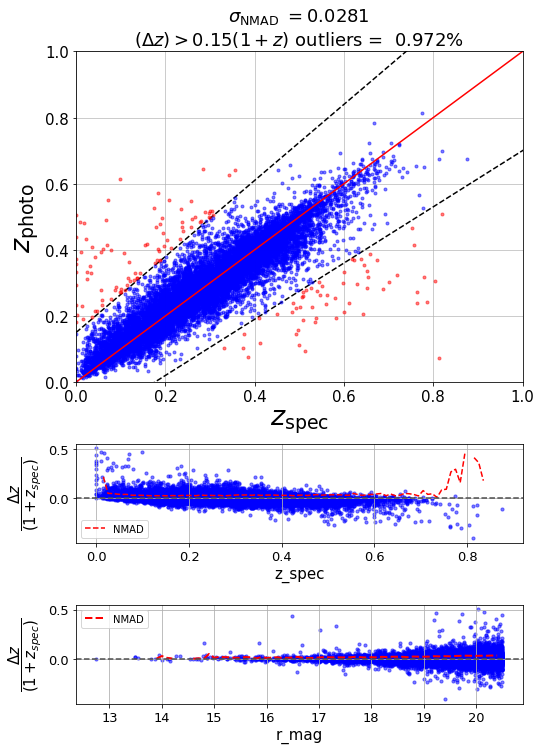

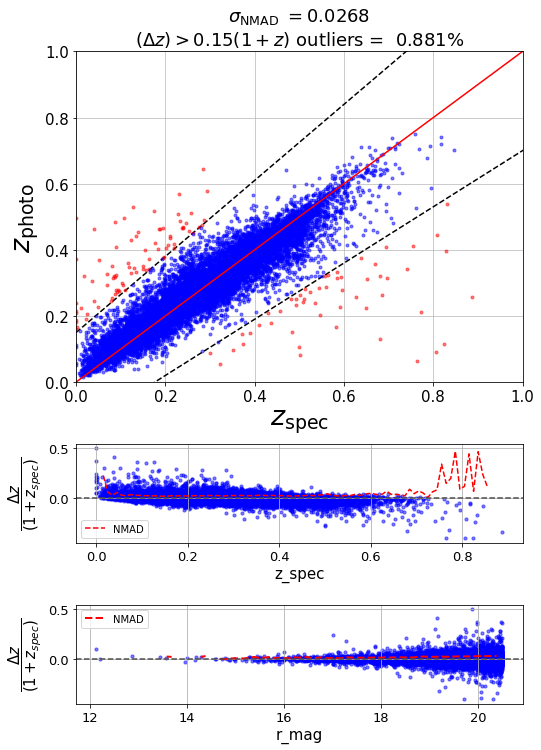

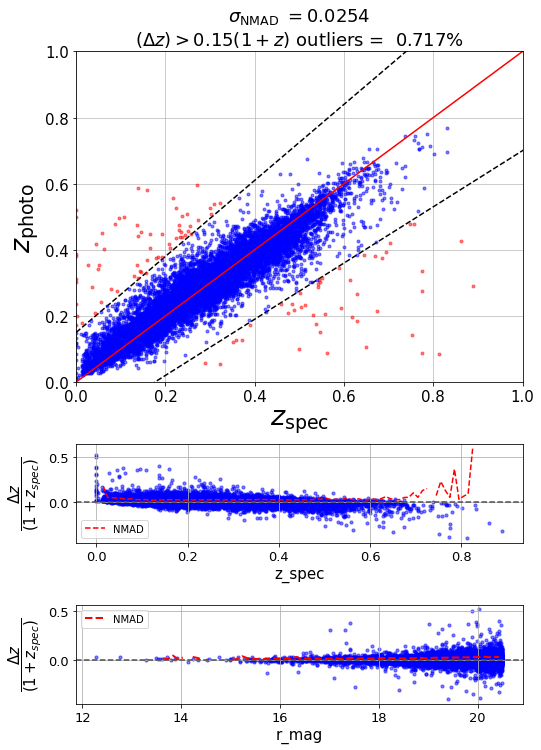

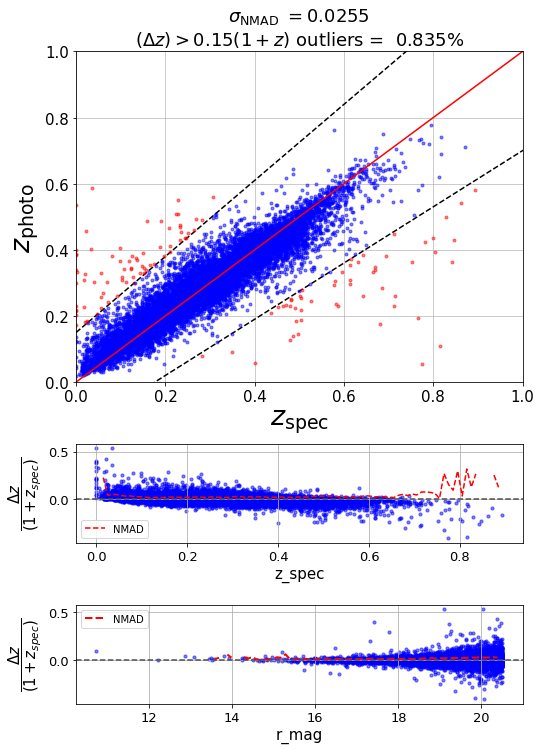

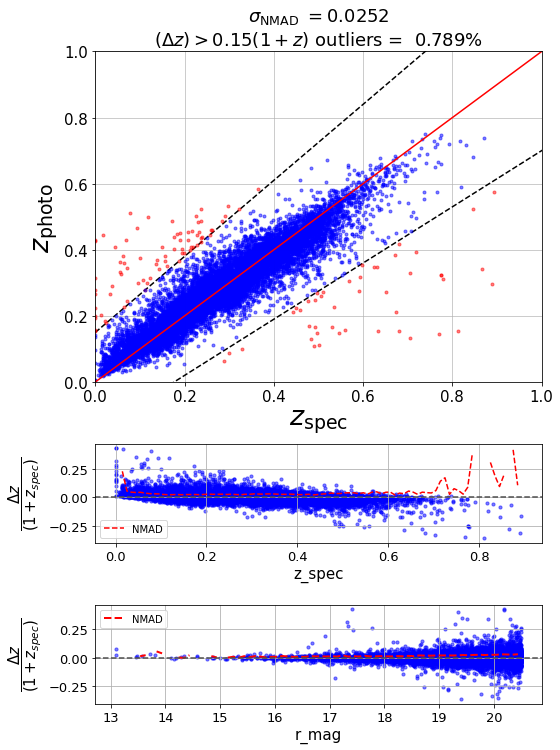

In [555]:
# trend with estimators/trees 
res1,zp1,zs1 = regrf(data,z,5,30,0.8,0.2)
res2,zp2,zs2 = regrf(data,z,10,30,0.8,0.2)
res3,zp3,zs3 = regrf(data,z,20,30,0.8,0.2)
res4,zp4,zs4 = regrf(data,z,30,30,0.8,0.2)
res5,zp5,zs5 = regrf(data,z,40,30,0.8,0.2)

### Cross Validation with Trees

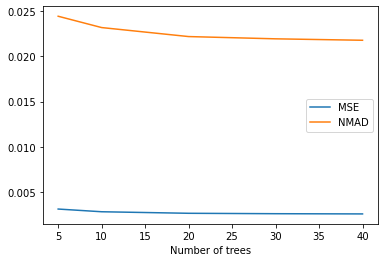

In [561]:
from sklearn.metrics import mean_squared_error,median_absolute_error
if 1:
    ntree_test = 5,10,20,30,40
    mse=np.copy(ntree_test)*0.
    mad=np.copy(ntree_test)*0.

    for i,n in enumerate(ntree_test):
        # define the RF object with our choice of number of trees
        regrf = RandomForestRegressor(n_estimators = n, \
                                      max_depth = 30, max_features = 'auto')
        # do training AND prediction on the whole sample 
        #     using cross-validation
        predicted = cross_val_predict(regrf,scaled_train,z_train, cv=5)
        #calculate mean squared error
        mse[i]=mean_squared_error(z_train,predicted)
        #calculate MAD
        mad[i]=median_absolute_error(z_train,predicted)

    plt.plot(ntree_test, mse,label='MSE')
    plt.plot(ntree_test, mad,label='NMAD')
    plt.legend()
    plt.xlabel('Number of trees')

## Trend with trees 


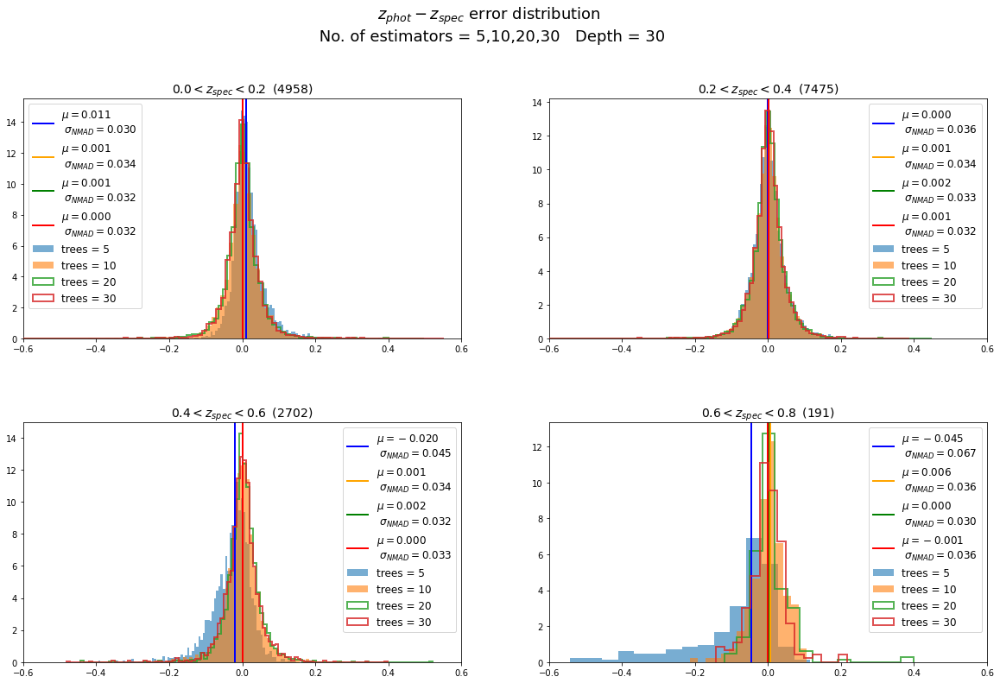

In [568]:

fig = plt.figure(figsize=(20,12))
fig.subplots_adjust(hspace=0.35)
fig.suptitle('$z_{phot} - z_{spec}$ error distribution \n No. of estimators = 5,10,20,30   Depth = 30',y = 1.005, fontsize =18)
f = 15
axes = gridspec.GridSpec(ncols=2, nrows=2,
                     height_ratios=[5,5],width_ratios =[10,10])

for i in range(len(arr_z)-1):
    arr_z = np.arange(0,1.,0.2)
    lw = 2
    if i==3:
        bins = 15
    else:
        bins = 100
#     noise = random.randn(len(zs))
    colnames = ['zs1','zp1','zs2','zp2','zs3','zp3','zs4','zp4','zs5','zp5','zs6','zp6','zs7','zp7','zs8','zp8','zs9','zp9','zs10','zp10']
    df = pd.DataFrame(list(zip(zs1, zp1,zs2,zp2,zs3,zp3,zs4,zp4,zs5,zp5,zs6,zp6,zs7,zp7,zs8,zp8,zs9,zp9,zs10,zp10)),columns= colnames)
    mask = (df.zs1 > arr_z[i]) & (df.zs1 < arr_z[i+1])
    zerr1 = df[mask].zp1 - df[mask].zs1 
    zerr2 = df[mask].zp2 - df[mask].zs2
    zerr3 = df[mask].zp3 - df[mask].zs3
    zerr4 = df[mask].zp4 - df[mask].zs4
    zerr5 = df[mask].zp5 - df[mask].zs5

    mu1 = np.median(zerr1)
    mu2 = np.median(zerr2)
    mu3 = np.median(zerr3)
    mu4 = np.median(zerr4)
    mu5 = np.median(zerr5)

    nmad1 = 1.48 * np.median(np.abs(zerr1))
    nmad2 = 1.48 * np.median(np.abs(zerr2))   
    nmad3 = 1.48 * np.median(np.abs(zerr3))   
    nmad4 = 1.48 * np.median(np.abs(zerr4))   
    nmad5 = 1.48 * np.median(np.abs(zerr5))   

    ax = fig.add_subplot(axes[i])
    ax.hist(zerr1,bins=bins,histtype='stepfilled',density=True,label='trees = 5',alpha=0.6)
    ax.hist(zerr2,bins=bins,histtype='stepfilled',density=True, label='trees = 10',alpha=0.6)
    ax.hist(zerr3,bins=bins,histtype='step',density=True, label='trees = 20',linewidth=2.,alpha=0.8)
    ax.hist(zerr4,bins=bins,histtype='step',density=True, label='trees = 30',linewidth=2.,alpha=0.8,zorder=100)
#     ax.hist(zerr5,bins=bins,histtype='step',density=True, label='trees = 40',linewidth=2.,alpha=0.8,zorder=100)
    ax.axvline(mu1,color = 'blue',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu1,nmad1))
    ax.axvline(mu2,color = 'orange',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu2,nmad2))
    ax.axvline(mu3,color = 'green',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu3,nmad3))
    ax.axvline(mu4,color = 'red',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu4,nmad4))
#     ax.axvline(mu5,color = 'red',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu5,nmad5))

    ax.legend(fontsize=12)
    ax.set_xlim(-0.6,0.6)
    ax.set_title('$%.1f < z_{spec} < %.1f \; \; (%s)$'%(arr_z[i],arr_z[i+1],np.sum(mask)),fontsize=14)

fig.savefig('rfr_err_hist.jpeg',bbox_inches='tight')

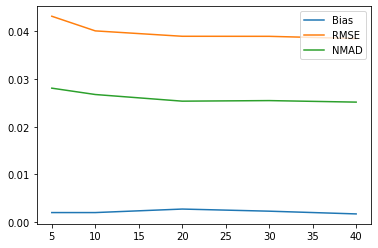

In [574]:
est = [5,10,20,30,40]
bias = [res1[1],res2[1],res3[1],res4[1],res5[1]]
rmse = [res1[0],res2[0],res3[0],res4[0],res5[0]]
nmad = [res1[6],res2[6],res3[6],res4[6],res5[6]]
outl = [res1[7],res2[7],res3[7],res4[7],res5[7]]
plt.plot(est,bias,label='Bias')
plt.plot(est,rmse,label='RMSE')
plt.plot(est,nmad,label='NMAD')
plt.legend(loc='best')
# plt.plot(est,outl)

## Trend with depth 


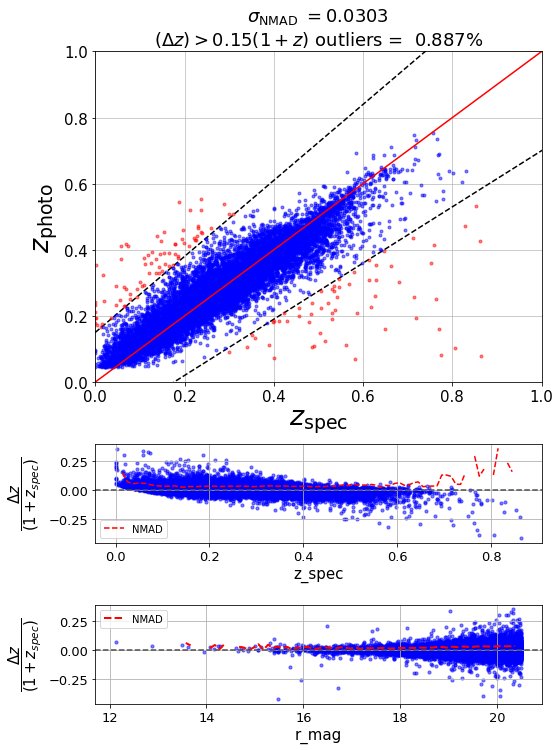

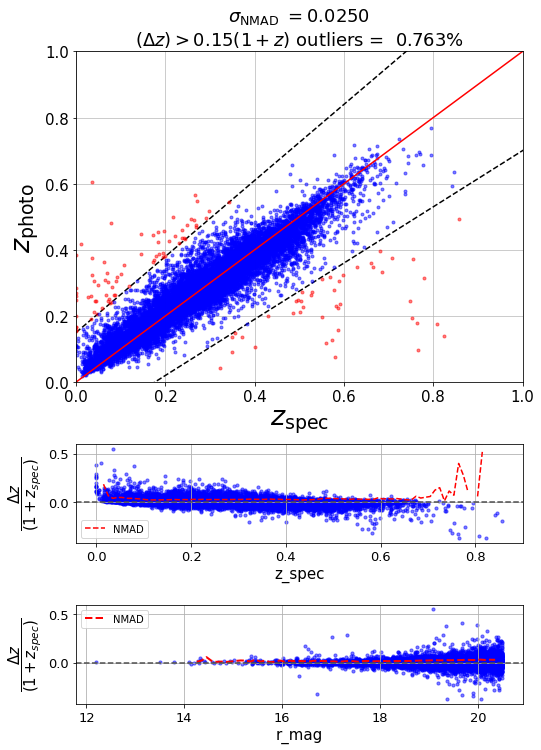

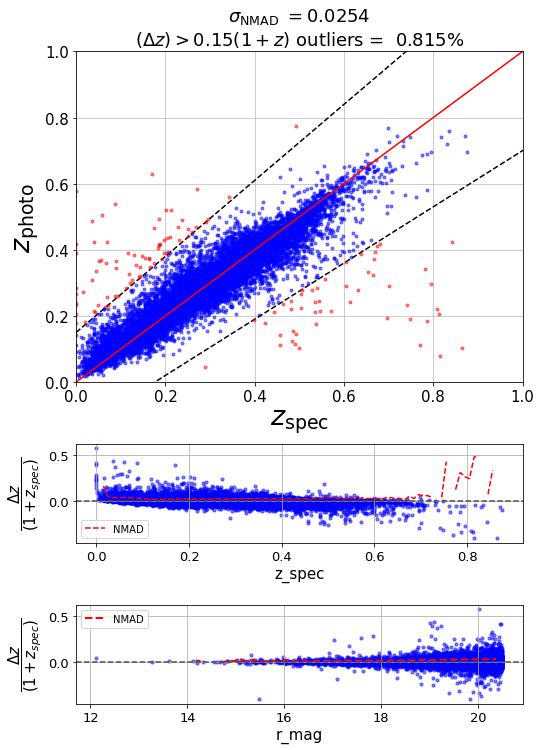

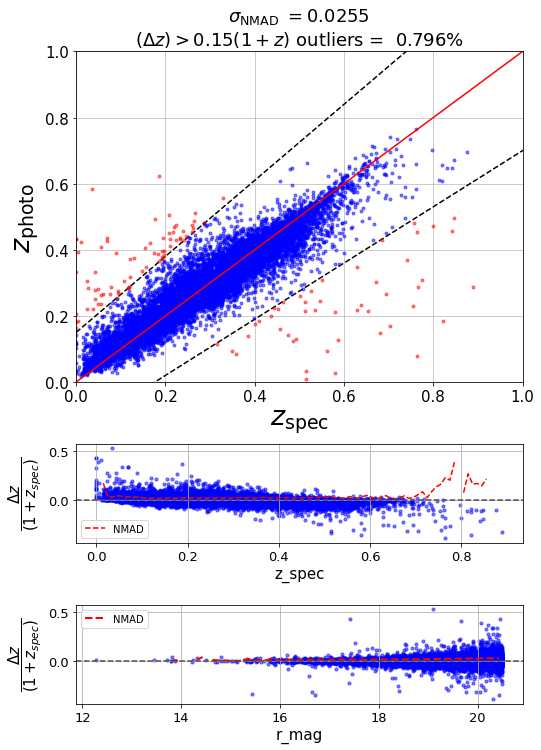

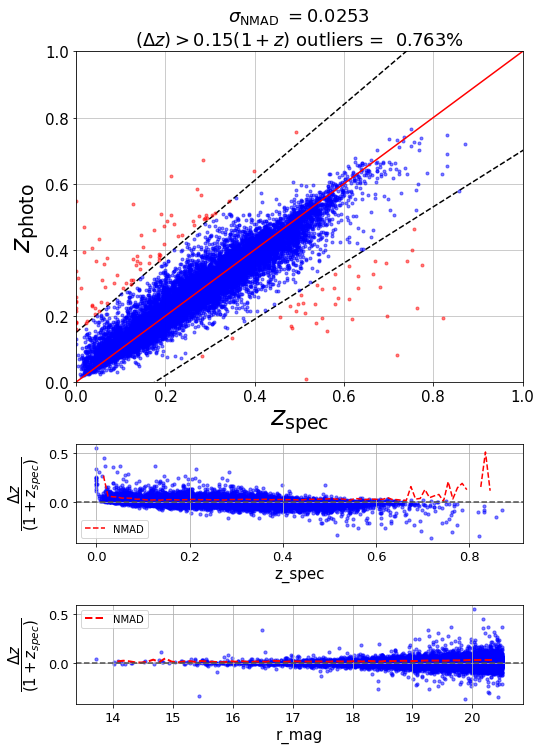

In [575]:
# trend with depth 
res6,zp6,zs6 = regrf(data,z,30,10,0.8,0.2)
res7,zp7,zs7 = regrf(data,z,30,20,0.8,0.2)
res8,zp8,zs8 = regrf(data,z,30,40,0.8,0.2)
res9,zp9,zs9 = regrf(data,z,30,60,0.8,0.2)
res10,zp10,zs10 = regrf(data,z,30,80,0.8,0.2)

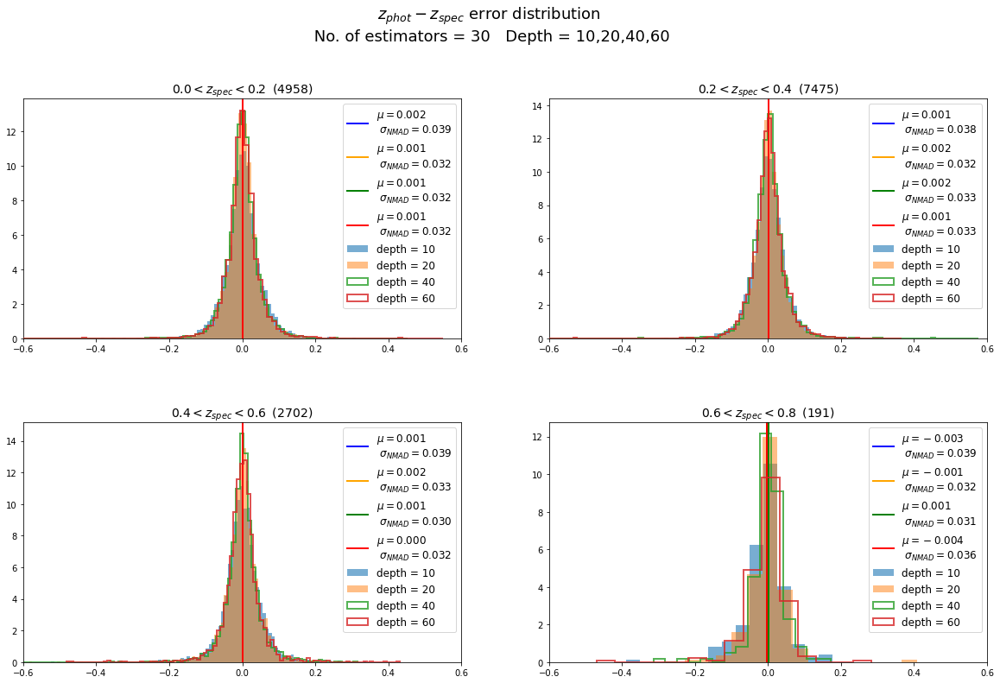

In [576]:

fig = plt.figure(figsize=(20,12))
fig.subplots_adjust(hspace=0.35)
fig.suptitle('$z_{phot} - z_{spec}$ error distribution \n No. of estimators = 30   Depth = 10,20,40,60',y = 1.005, fontsize =18)
f = 15
axes = gridspec.GridSpec(ncols=2, nrows=2,
                     height_ratios=[5,5],width_ratios =[10,10])

for i in range(len(arr_z)-1):
    arr_z = np.arange(0,1.,0.2)
    lw = 2
    if i==3:
        bins = 15
    else:
        bins = 100
#     noise = random.randn(len(zs))
    colnames = ['zs1','zp1','zs2','zp2','zs3','zp3','zs4','zp4','zs5','zp5','zs6','zp6','zs7','zp7','zs8','zp8','zs9','zp9','zs10','zp10']
    df = pd.DataFrame(list(zip(zs1, zp1,zs2,zp2,zs3,zp3,zs4,zp4,zs5,zp5,zs6,zp6,zs7,zp7,zs8,zp8,zs9,zp9,zs10,zp10)),columns= colnames)
    mask = (df.zs1 > arr_z[i]) & (df.zs1 < arr_z[i+1])
    zerr6 = df[mask].zp6 - df[mask].zs6 
    zerr7 = df[mask].zp7 - df[mask].zs7
    zerr8 = df[mask].zp8 - df[mask].zs8
    zerr9 = df[mask].zp9 - df[mask].zs9
    zerr10 = df[mask].zp10 - df[mask].zs10

    mu6 = np.median(zerr6)
    mu7 = np.median(zerr7)
    mu8 = np.median(zerr8)
    mu9 = np.median(zerr9)
    mu10 = np.median(zerr10)

    nmad6 = 1.48 * np.median(np.abs(zerr6))
    nmad7 = 1.48 * np.median(np.abs(zerr7))   
    nmad8 = 1.48 * np.median(np.abs(zerr8))   
    nmad9 = 1.48 * np.median(np.abs(zerr9))   
    nmad10 = 1.48 * np.median(np.abs(zerr10))   

    ax = fig.add_subplot(axes[i])
    ax.hist(zerr6,bins=bins,histtype='stepfilled',density=True,label='depth = 10',alpha=0.6)
    ax.hist(zerr7,bins=bins,histtype='stepfilled',density=True, label='depth = 20',alpha=0.5)
    ax.hist(zerr8,bins=bins,histtype='step',density=True, label='depth = 40',linewidth=2.,alpha=0.8)
    ax.hist(zerr9,bins=bins,histtype='step',density=True, label='depth = 60',linewidth=2.,alpha=0.8,zorder=100)
#     ax.hist(zerr5,bins=bins,histtype='step',density=True, label='trees = 40',linewidth=2.,alpha=0.8,zorder=100)
    ax.axvline(mu6,color = 'blue',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu6,nmad6))
    ax.axvline(mu7,color = 'orange',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu7,nmad7))
    ax.axvline(mu8,color = 'green',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu8,nmad8))
    ax.axvline(mu9,color = 'red',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu9,nmad9))
#     ax.axvline(mu5,color = 'red',lw=lw,label='$\mu = %.3f$ \n $\sigma_{NMAD} = %.3f$'%(mu5,nmad5))

    ax.legend(fontsize=12)
    ax.set_xlim(-0.6,0.6)
    ax.set_title('$%.1f < z_{spec} < %.1f \; \; (%s)$'%(arr_z[i],arr_z[i+1],np.sum(mask)),fontsize=14)

fig.savefig('rfr_err_hist_depth.jpeg',bbox_inches='tight')

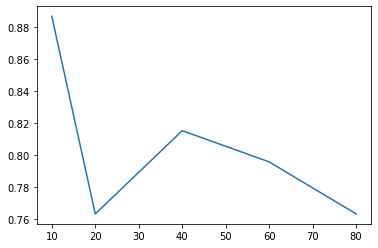

In [577]:
est = [10,20,40,60,80]
bias = [res6[1],res7[1],res8[1],res9[1],res10[1]]
rmse = [res6[0],res7[0],res8[0],res9[0],res10[0]]
nmad = [res6[6],res7[6],res8[6],res9[6],res10[6]]
outl = [res6[7],res7[7],res8[7],res9[7],res10[7]]
# plt.plot(est,bias)
# plt.plot(est,rmse)
# plt.plot(est,nmad)
plt.plot(est,outl)

### Cross Validation with Depth

In [ ]:
from sklearn.metrics import mean_squared_error,median_absolute_error
ndepth_test = 10,20,40,60,80
mse=np.copy(ntree_test)*0.
mad=np.copy(ntree_test)*0.

for i,n in enumerate(ndepth_test):
    # define the RF object with our choice of number of trees
    regrf = RandomForestRegressor(n_estimators = 30, \
                                  max_depth = n, max_features = 'auto')
    # do training AND prediction on the whole sample 
    #     using cross-validation
    predicted = cross_val_predict(regrf,scaled_train,z_train, cv=5)
    #calculate mean squared error
    mse[i]=mean_squared_error(z_train,predicted)
    #calculate MAD
    mad[i]=median_absolute_error(z_train,predicted)

plt.plot(ntree_test, mse,label='MSE')
#     plt.plot(ntree_test, mad,label='NMAD')
plt.legend()
plt.xlabel('Number of trees')

In [578]:
frames = [res1, res2,res3,res4,res5,res6,res7,res8,res9,res10]
colnames = ['res1', 'res2','res3','res4','res5','res6','res7','res8','res9','res10']
result = pd.concat(frames,axis=1)
result.columns = colnames
result
result.to_csv('std_tree_depth.csv')

## k-Nearest neighbors, weighted/unweighted, 80-20 split

In [635]:
def fregknn(data,z,n_neighbors,weights,ftest,ftrain):
    
    scaler = StandardScaler()
    scaler.fit(data)  
    scaled_data = scaler.transform(data)
    
    # uniformly weighting 10 nearest neighbors:
    # or weighting neighbors inversely proportional to their distance:
    
    data_train, data_test, z_train, z_test, scaled_train, scaled_test \
            =train_test_split(data, z, scaled_data, \
                        test_size = ftest, train_size = ftrain)
    
    i_mag = data_test[:,9]
    regknn = KNeighborsRegressor(n_neighbors = n_neighbors, weights = weights)
    regknn.fit(scaled_train,z_train)

    z_phot = regknn.predict(scaled_test)
    z_spec = z_test

    result = plot_and_stats(z_spec,z_phot,i_mag)
    return(result,z_phot,z_spec)

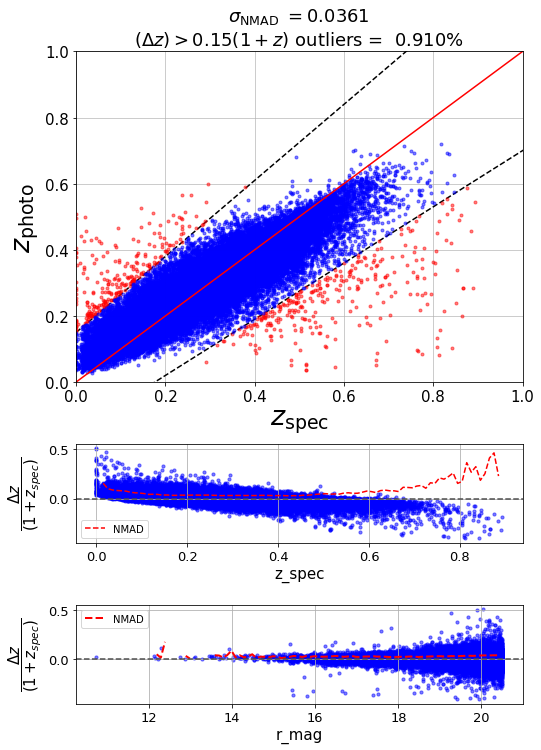

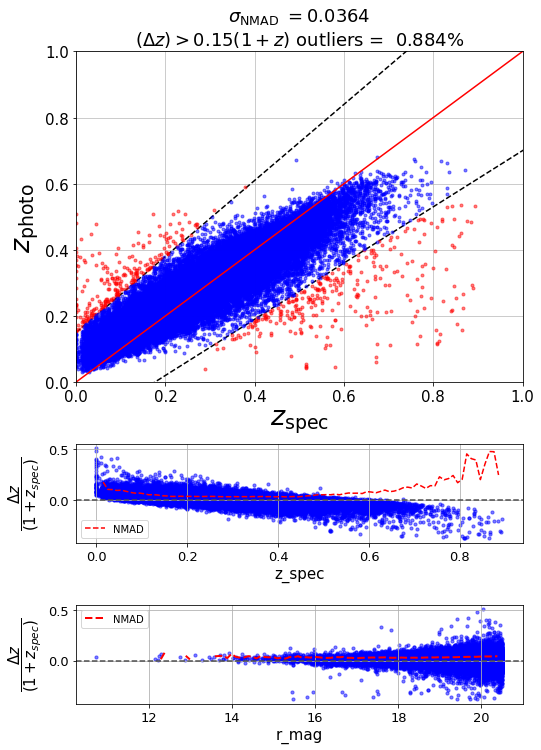

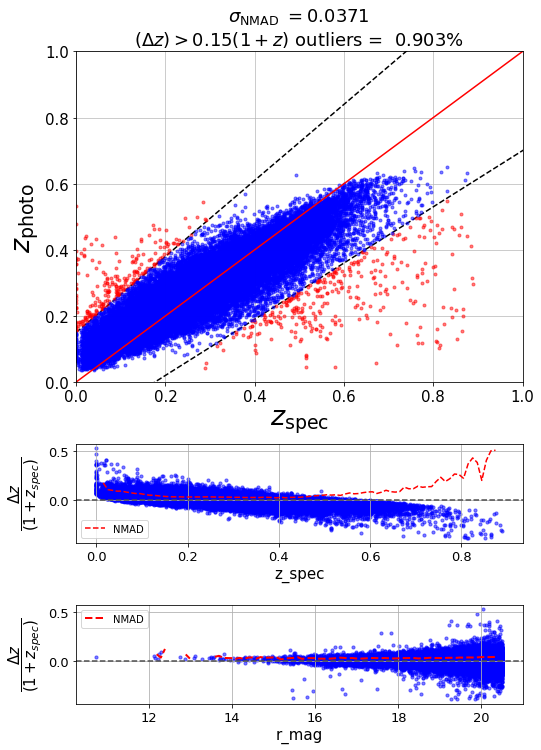

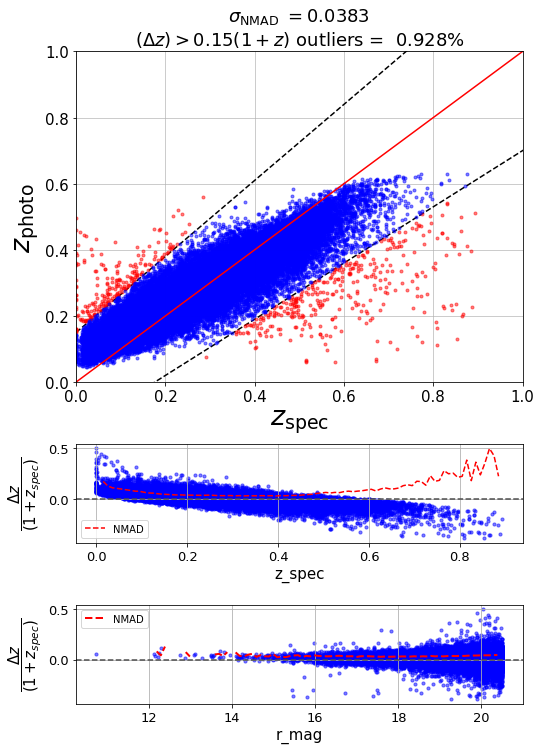

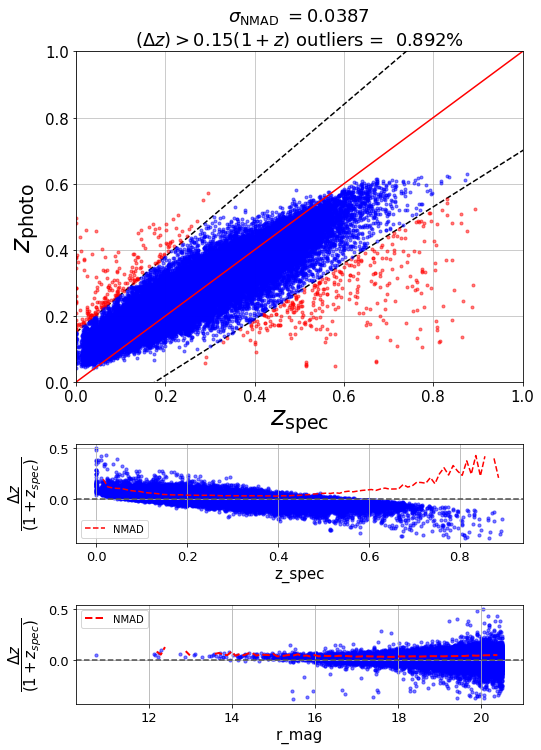

In [636]:
# trend with neighbours + uniform 
res1,zp1,zs1 = fregknn(data,z,10,'uniform',0.8,0.2)
res2,zp2,zs2 = fregknn(data,z,20,'uniform',0.8,0.2)
res3,zp3,zs3 = fregknn(data,z,30,'uniform',0.8,0.2)
res4,zp4,zs4 = fregknn(data,z,40,'uniform',0.8,0.2)
res5,zp5,zs5 = fregknn(data,z,50,'uniform',0.8,0.2)


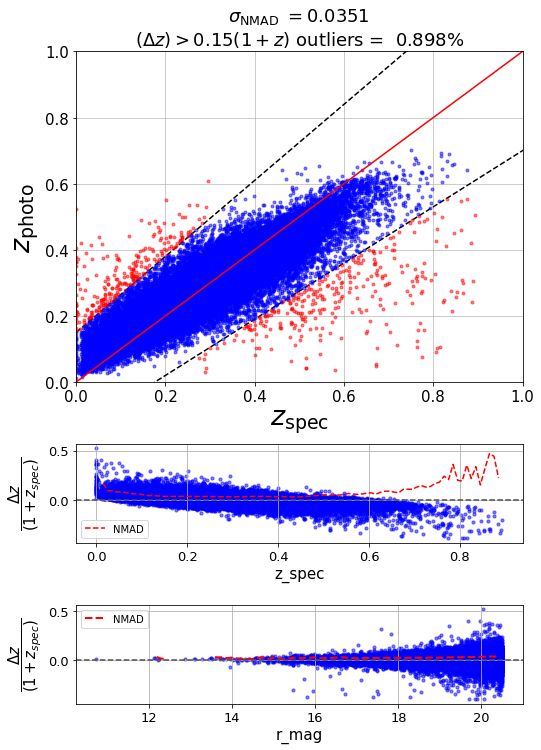

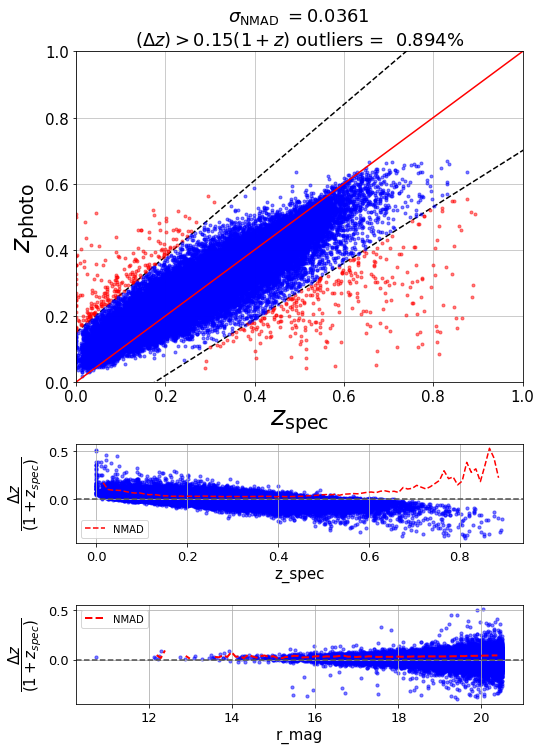

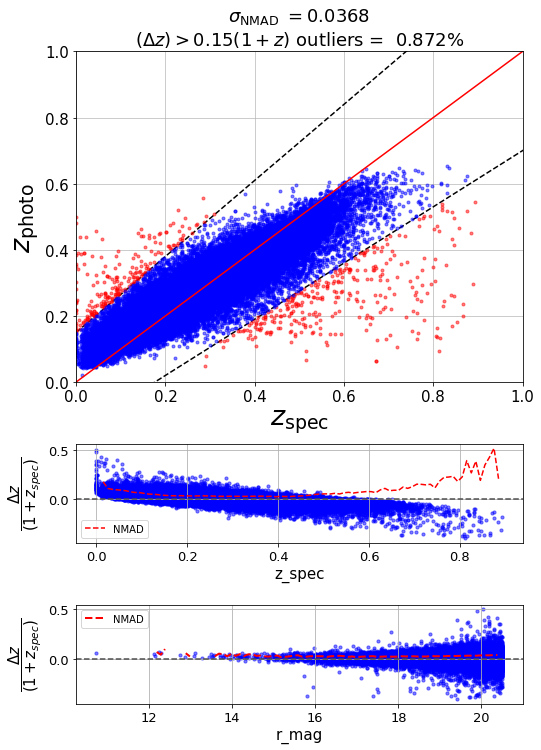

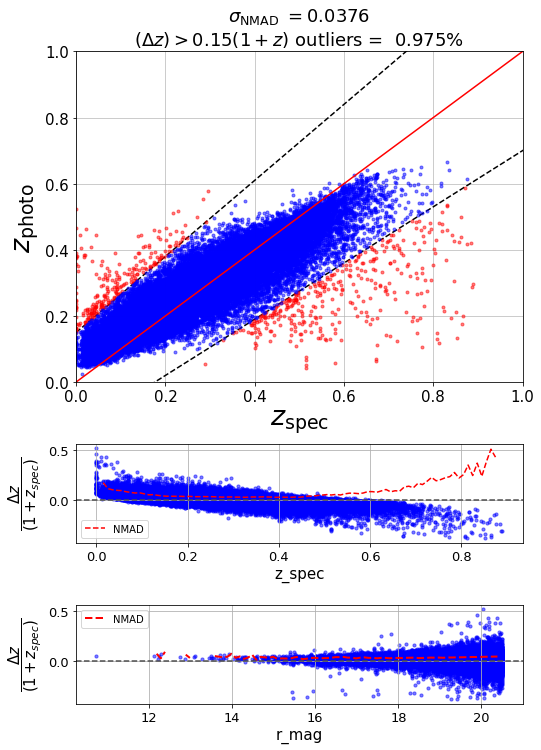

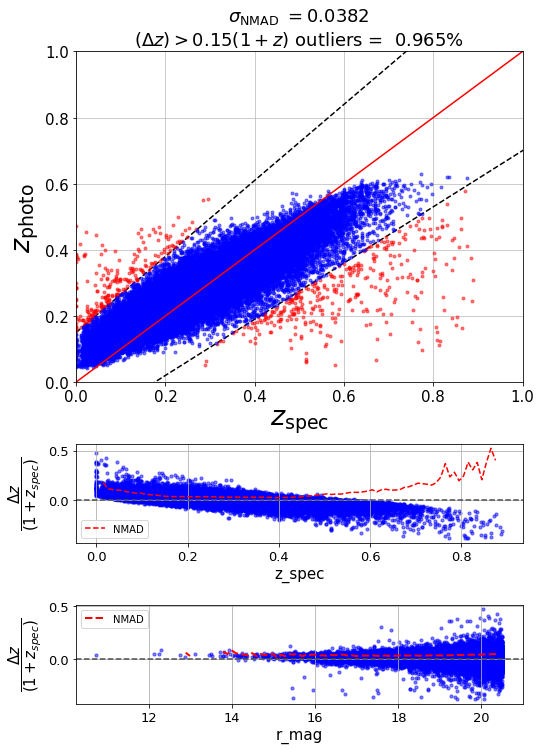

In [637]:
# trend with neighbours + distance 
res6,zp6,zs6 = fregknn(data,z,10,'distance',0.8,0.2)
res7,zp7,zs7 = fregknn(data,z,20,'distance',0.8,0.2)
res8,zp8,zs8 = fregknn(data,z,30,'distance',0.8,0.2)
res9,zp9,zs9 = fregknn(data,z,40,'distance',0.8,0.2)
res10,zp10,zs10 = fregknn(data,z,50,'distance',0.8,0.2)


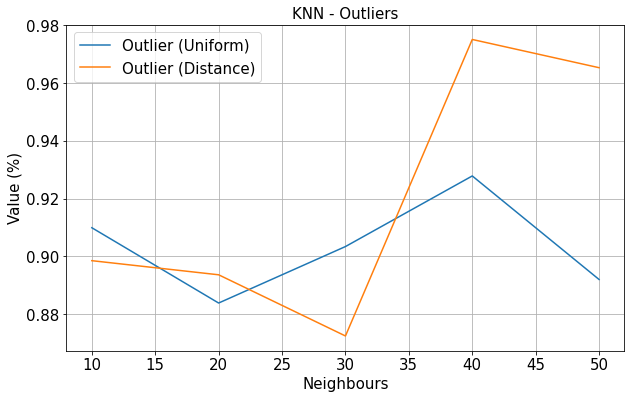

In [638]:
plt.figure(figsize=(10, 6))
f = 15
est = [10,20,30,40,50]
bias = [res1[1],res2[1],res3[1],res4[1],res5[1]]
rmse = [res1[0],res2[0],res3[0],res4[0],res5[0]]
nmad = [res1[6],res2[6],res3[6],res4[6],res5[6]]
outl = [res1[7],res2[7],res3[7],res4[7],res5[7]]
# plt.plot(est,bias,label='Bias (uniform)')
# plt.plot(est,rmse,label='RMSE (uniform)')
# plt.plot(est,nmad,label='NMAD (uniform)')
plt.title('KNN - Outliers',fontsize=15)
plt.xlabel('Neighbours',fontsize=f)
plt.ylabel('Value (%)',fontsize=f)
plt.xticks(fontsize=f)
plt.yticks(fontsize=f)

plt.plot(est,outl,label='Outlier (Uniform)')
bias1 = [res6[1],res7[1],res8[1],res9[1],res10[1]]
rmse1 = [res6[0],res7[0],res8[0],res9[0],res10[0]]
nmad1 = [res6[6],res7[6],res8[6],res9[6],res10[6]]
outl1 = [res6[7],res7[7],res8[7],res9[7],res10[7]]
# plt.plot(est,bias1,label='Bias (distance)')
# plt.plot(est,rmse1,label='RMSE (distance)')
# plt.plot(est,nmad1,label='NMAD (distance)')
plt.plot(est,outl1,label='Outlier (Distance)')
plt.legend(loc='best',fontsize=f)
plt.grid()

plt.savefig('knn_outliers.jpeg')

In [639]:
frames = [res1, res2,res3,res4,res5,res6,res7,res8,res9,res10]
colnames = ['res1', 'res2','res3','res4','res5','res6','res7','res8','res9','res10']
result = pd.concat(frames,axis=1)
result.columns = colnames
result
result.to_csv('knn_uni_dis.csv')

## Method-1 : XGBOOST 

Extreme Gradient Boosting (XGBoost) provides an efficient implementation of the gradient boosting algorithm. Models are fit using any arbitrary differentiable loss function and gradient descent optimization algorithm. This gives the technique its name, “gradient boosting,” as the loss gradient is minimized as the model is fit, much like a neural network.



In [57]:
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

In [646]:
def xgboost(data,z,objective,estimators,ftest,ftrain):

    scaler = StandardScaler()
    scaler.fit(data)  
    scaled_data = scaler.transform(data)
    
    # uniformly weighting 10 nearest neighbors:
    # or weighting neighbors inversely proportional to their distance:
    
    data_train, data_test, z_train, z_test, scaled_train, scaled_test \
            =train_test_split(data, z, scaled_data, \
                        test_size = ftest, train_size = ftrain)
    
    i_mag = data_test[:,9]
    model = XGBRegressor(objective=objective,n_estimators=estimators) #gbtree,gblinear
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
    n_scores = cross_val_score(model, scaled_train, z_train, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1, error_score='raise')
    print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

    # fit the model with training data
    model = XGBRegressor(objective=objective,n_estimators=estimators)  # 
    model.fit(scaled_train, z_train)

    # predict values for test data
    z_phot = model.predict(scaled_test)
    z_spec = z_test

    #Make a photo-z/spec-z plot and output summary statistics.
    result = plot_and_stats(z_spec,z_phot,i_mag)
    
    return(result,z_phot,z_spec)

MAE: -0.057 (0.001)
MAE: -0.039 (0.001)
MAE: -0.036 (0.001)
MAE: -0.036 (0.001)
MAE: -0.035 (0.001)


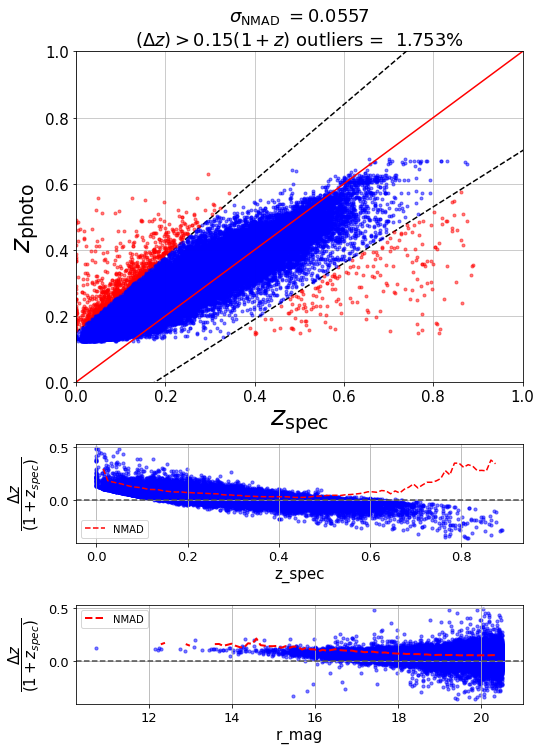

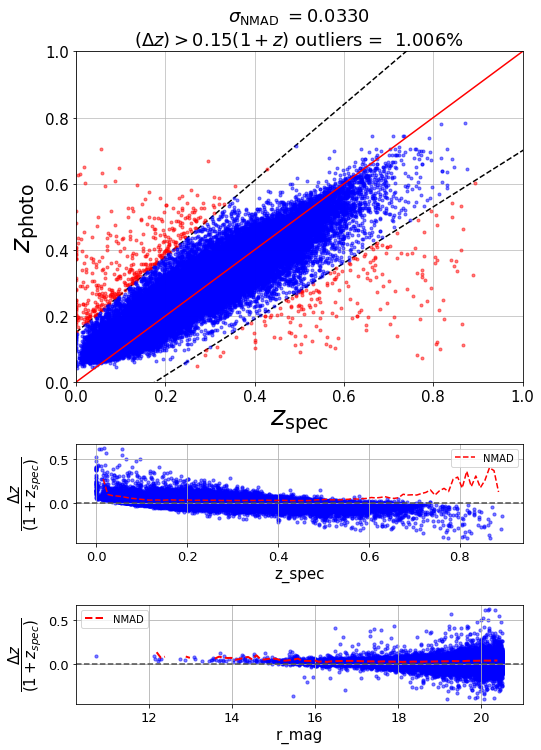

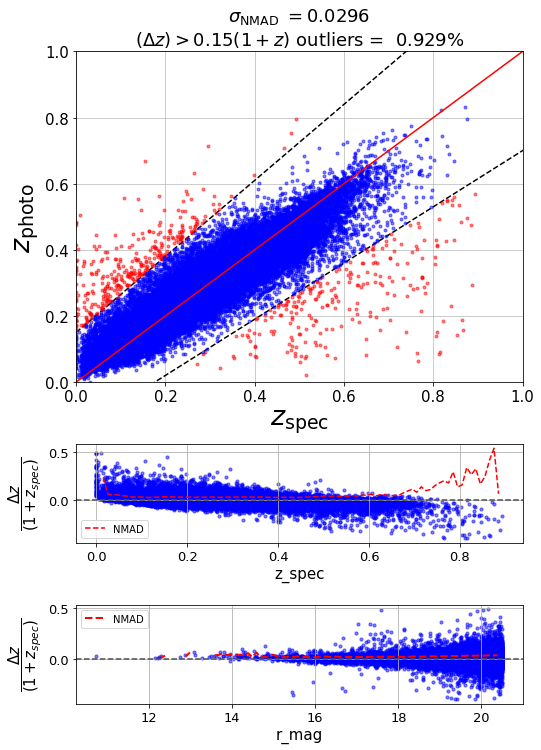

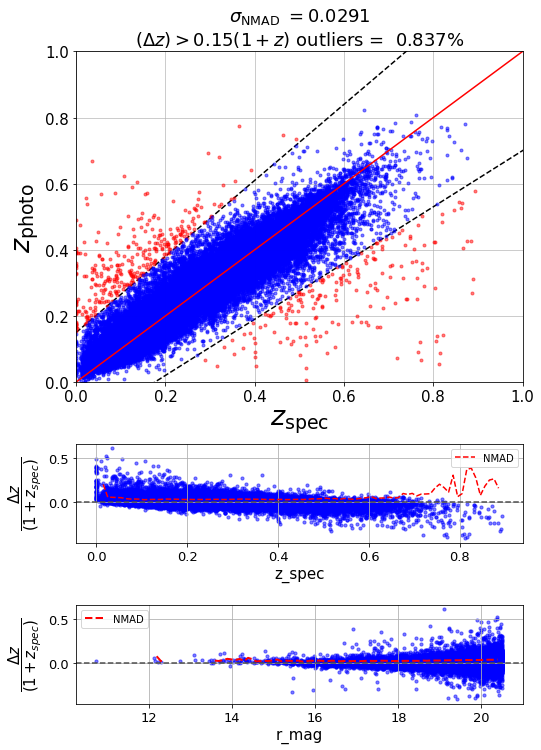

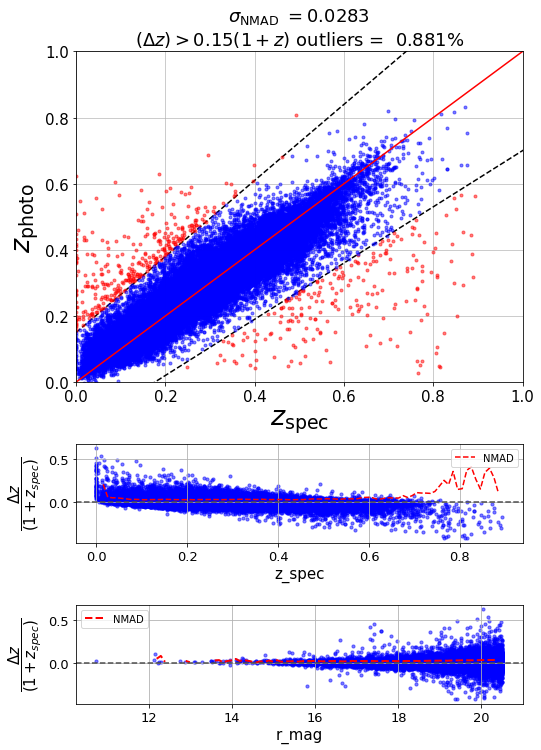

In [652]:
# trends with objective function and estimators

res1,zp1,zs1 = xgboost(data,z,'reg:pseudohubererror',5,0.8,0.2)
res2,zp2,zs2 = xgboost(data,z,'reg:pseudohubererror',10,0.8,0.2)
res3,zp3,zs3 = xgboost(data,z,'reg:pseudohubererror',20,0.8,0.2)
res4,zp4,zs4 = xgboost(data,z,'reg:pseudohubererror',30,0.8,0.2)
res5,zp5,zs5 = xgboost(data,z,'reg:pseudohubererror',40,0.8,0.2)


MAE: -0.059 (0.001)
MAE: -0.040 (0.001)
MAE: -0.036 (0.001)
MAE: -0.035 (0.001)
MAE: -0.034 (0.001)


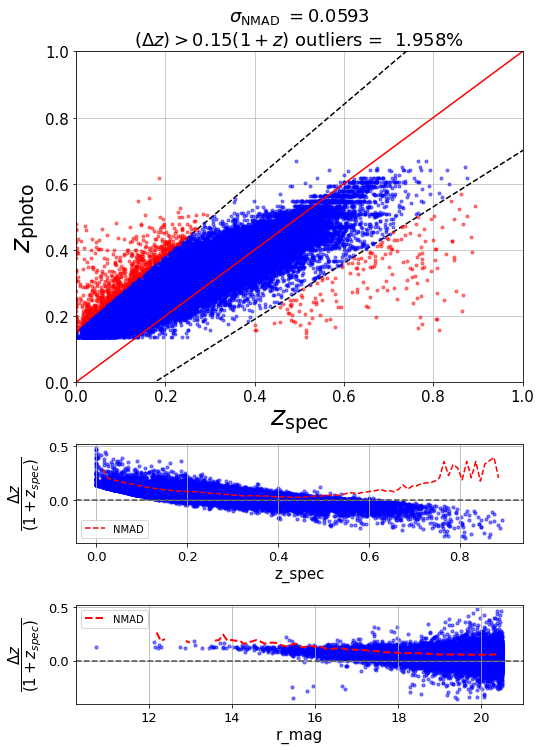

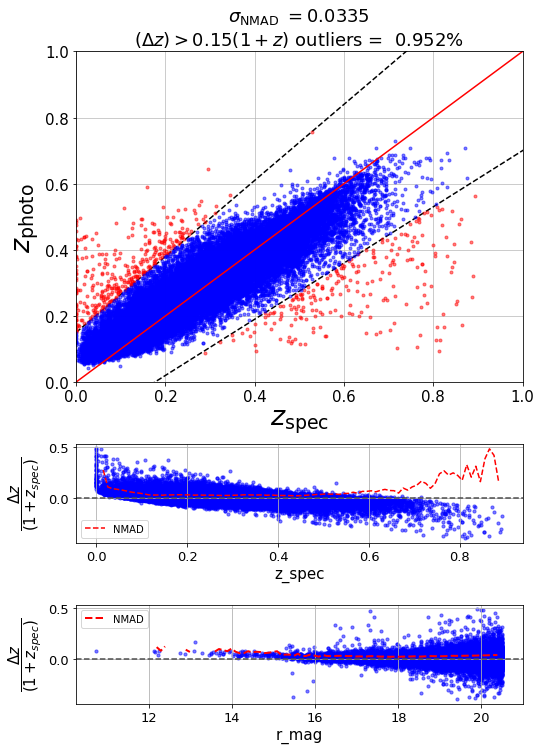

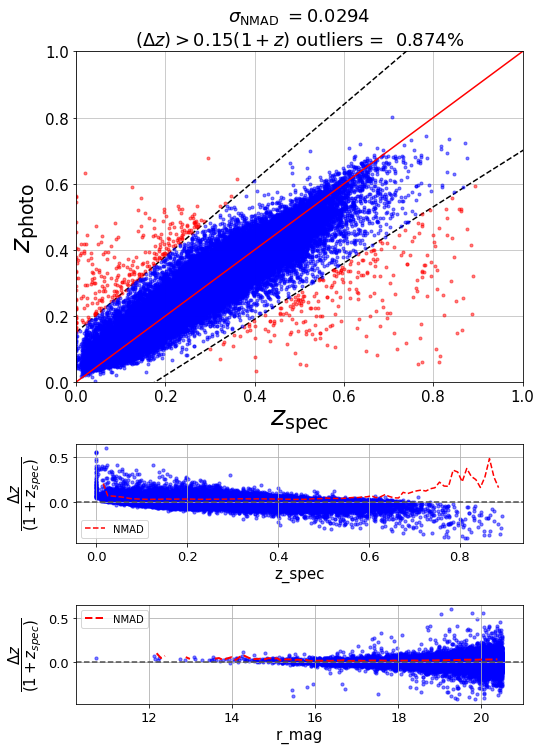

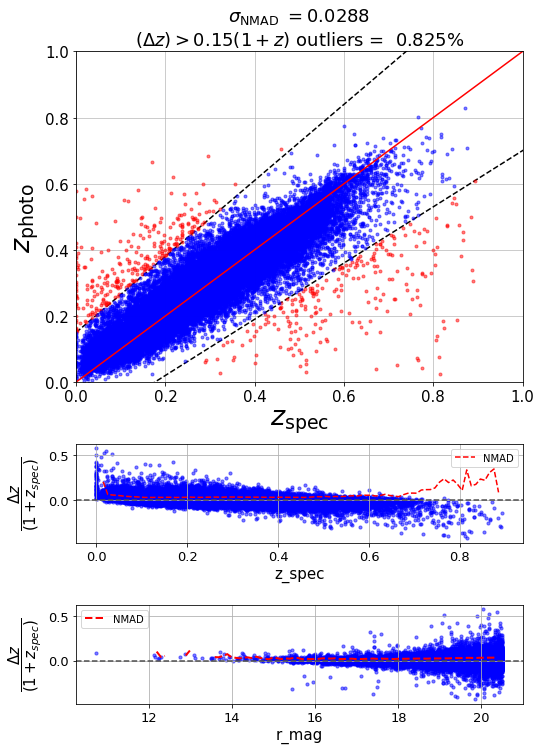

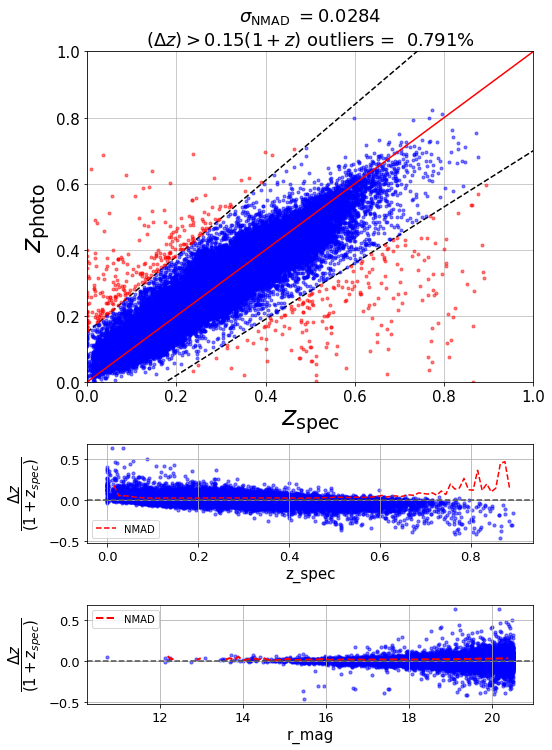

In [654]:
# trend with sqrd error and estimators

res6,zp6,zs6 = xgboost(data,z,'reg:squarederror',5,0.8,0.2)
res7,zp7,zs7 = xgboost(data,z,'reg:squarederror',10,0.8,0.2)
res8,zp8,zs8 = xgboost(data,z,'reg:squarederror',20,0.8,0.2)
res9,zp9,zs9 = xgboost(data,z,'reg:squarederror',30,0.8,0.2)
res10,zp10,zs10 = xgboost(data,z,'reg:squarederror',40,0.8,0.2)

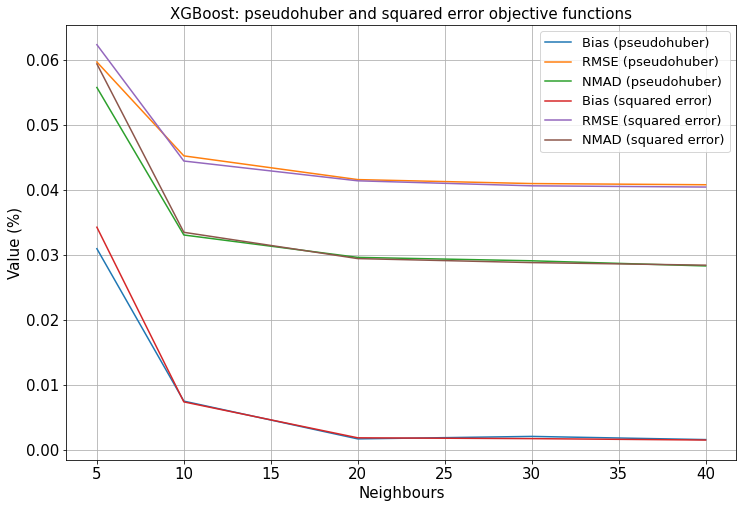

In [660]:
plt.figure(figsize=(12, 8))
f = 15
est = [5,10,20,30,40]
bias = [res1[1],res2[1],res3[1],res4[1],res5[1]]
rmse = [res1[0],res2[0],res3[0],res4[0],res5[0]]
nmad = [res1[6],res2[6],res3[6],res4[6],res5[6]]
outl = [res1[7],res2[7],res3[7],res4[7],res5[7]]
plt.plot(est,bias,label='Bias (pseudohuber)')
plt.plot(est,rmse,label='RMSE (pseudohuber)')
plt.plot(est,nmad,label='NMAD (pseudohuber)')
plt.title('XGBoost: pseudohuber and squared error objective functions',fontsize=15)
plt.xlabel('Neighbours',fontsize=f)
plt.ylabel('Value (%)',fontsize=f)
plt.xticks(fontsize=f)
plt.yticks(fontsize=f)
# plt.plot(est,outl,label='Outlier (Uniform)')

bias1 = [res6[1],res7[1],res8[1],res9[1],res10[1]]
rmse1 = [res6[0],res7[0],res8[0],res9[0],res10[0]]
nmad1 = [res6[6],res7[6],res8[6],res9[6],res10[6]]
outl1 = [res6[7],res7[7],res8[7],res9[7],res10[7]]
plt.plot(est,bias1,label='Bias (squared error)')
plt.plot(est,rmse1,label='RMSE (squared error)')
plt.plot(est,nmad1,label='NMAD (squared error)')
# plt.plot(est,outl1,label='Outlier (Distance)')
plt.legend(loc='best',fontsize=13)
plt.grid()

# plt.savefig('xgboost_outliers.jpeg')

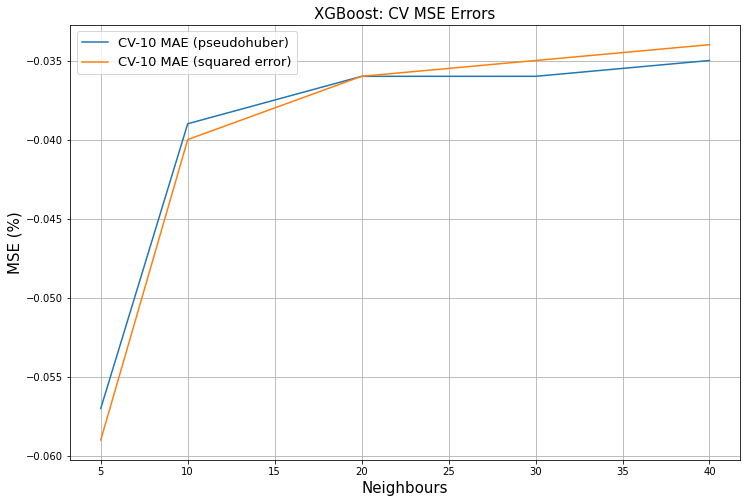

In [667]:
plt.figure(figsize=(12, 8))
est = [5,10,20,30,40]
mae1 = [-0.057,-0.039,-0.036,-0.036,-0.035]
mae2 = [-0.059,-0.040,-0.036,-0.035,-0.034]

plt.plot(est,mae1,label='CV-10 MAE (pseudohuber)')
plt.plot(est,mae2,label='CV-10 MAE (squared error)')
plt.legend(loc='best',fontsize=13)
plt.xlabel('Neighbours',fontsize=f)
plt.ylabel('MSE (%)',fontsize=f)
plt.title('XGBoost: CV MSE Errors',fontsize=15)


plt.grid()

plt.savefig('xgboost_cv.jpeg',bbox_inches = 'tight')

In [670]:
frames = [res1, res2,res3,res4,res5,res6,res7,res8,res9,res10]
colnames = ['res1', 'res2','res3','res4','res5','res6','res7','res8','res9','res10']
result = pd.concat(frames,axis=1)
result.columns = colnames
result
result.to_csv('xgboost.csv')

### Method-2 : CATBOOST 

CatBoost is a relatively new open-source machine learning algorithm, developed in 2017 by a company named Yandex. It has ability to integrate a variety of different data types, such as images, audio, or text features into one framework. It offers a way of handling categorical data, requiring a minimum of categorical feature transformation, opposed to the majority of other machine learning algorithms, that cannot handle non-numeric values. CatBoost builds upon the theory of decision trees and gradient boosting. Provides simple fitting scheme and high efficiency on CPUs, while the tree structure operates as a regularization to find an optimal solution and avoid overfitting.


In [817]:
from catboost import CatBoostRegressor
from catboost import Pool

# 80/20 split
df_train = cat_Z.iloc[: int(len(cat) * 0.8)]
df_test = cat_Z.iloc[ int(len(cat) * 0.8 ):]
z_train = df_train['Z']
z_test = df_test['Z']

df_train.drop(['Z','ZERR','SPECTYPE'],axis=1,inplace=True)
df_test.drop(['Z','ZERR','SPECTYPE'],axis=1,inplace=True)


/Users/yashakaushal/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4170: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [818]:
mae=[]
def catboost(df_train,z_train,df_test,z_test,n_estimators):
    # catboost for regression
    categorical_features_names = ['MORPHTYPE', 'PHOTSYS']

    # define dataset
    train_pool = Pool(df_train, 
                      label=z_train,
                      cat_features=categorical_features_names)
    test_pool = Pool(df_test,
                     label=z_test,
                     cat_features=categorical_features_names)
    
    i_mag = df_test['rmag'].values
    # evaluate the model
    model = CatBoostRegressor(verbose=0, n_estimators=n_estimators)
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
    n_scores = cross_val_score(model, df_train, z_train, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1, error_score='raise')
    print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))
    mae.append(mean(n_scores))

    # fit the model on the whole dataset
    model.fit(train_pool, eval_set = test_pool)

    # predict values for test data
    z_phot = model.predict(df_test)
    z_spec = z_test

    #Make a photo-z/spec-z plot and output summary statistics.
    result = plot_and_stats(z_spec,z_phot,i_mag)
    %timeit

    return(result,z_phot,z_spec)


MAE: -0.046 (0.001)
MAE: -0.037 (0.000)
MAE: -0.035 (0.000)
MAE: -0.034 (0.000)
MAE: -0.033 (0.000)


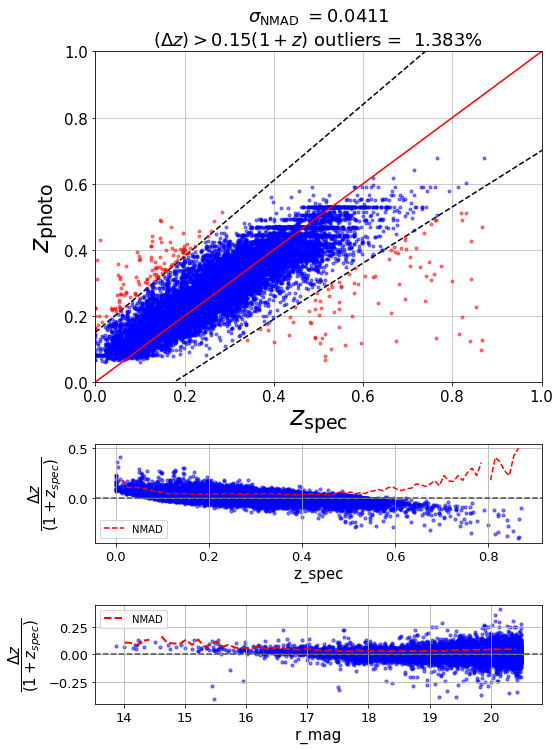

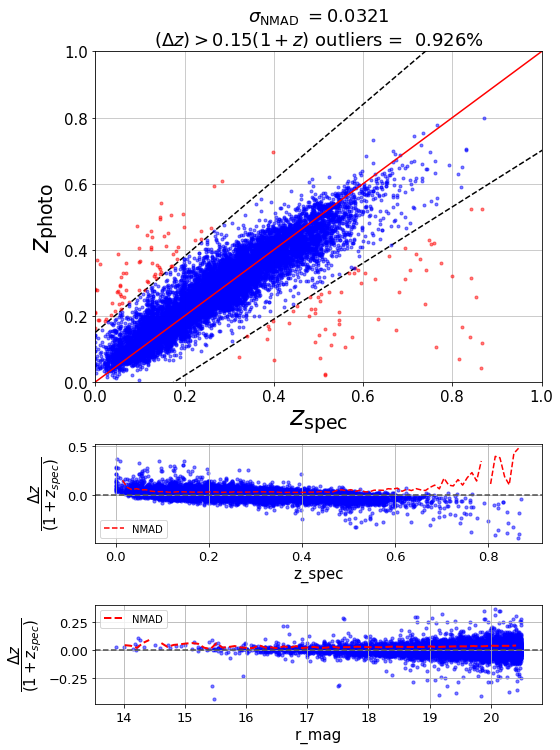

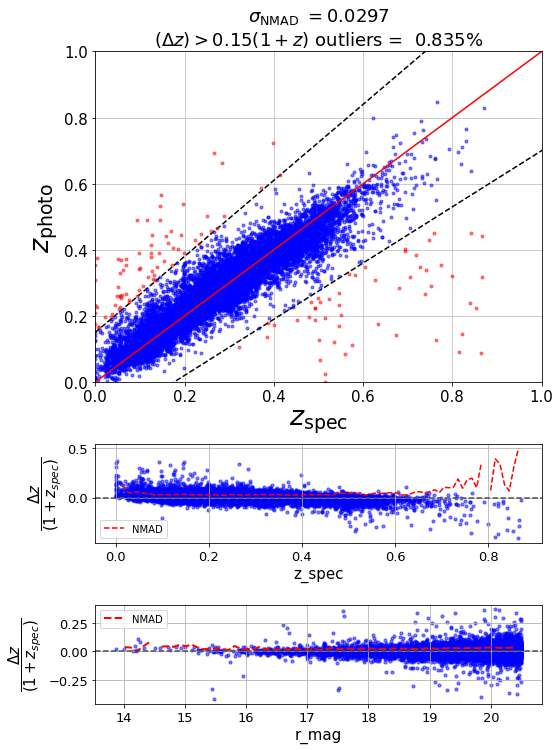

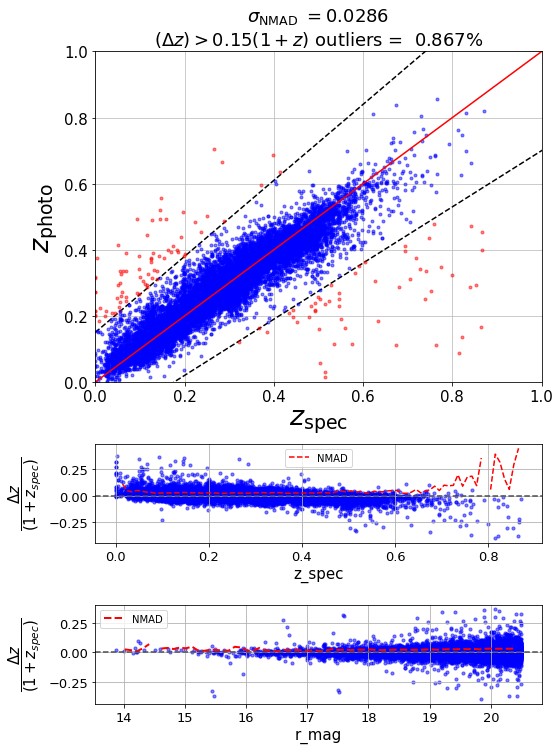

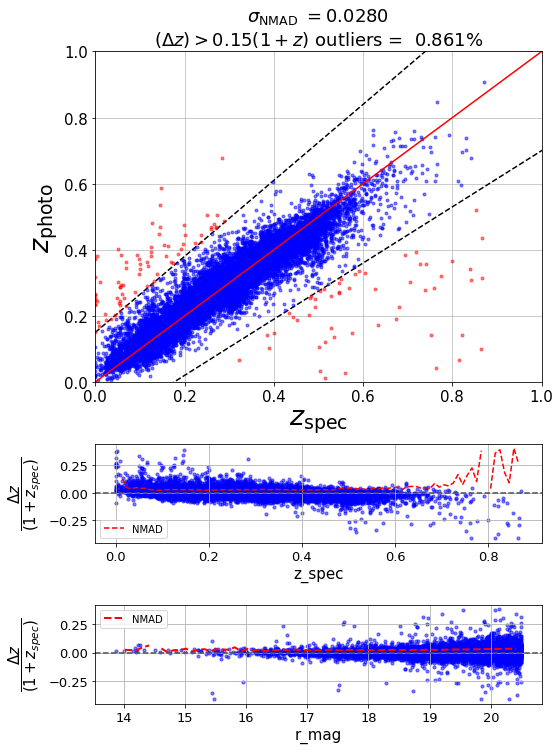

In [820]:
# trends with objective function and estimators

res1,zp1,zs1 = catboost(df_train,z_train,df_test,z_test,5)
res2,zp2,zs2 = catboost(df_train,z_train,df_test,z_test,20)
res3,zp3,zs3 = catboost(df_train,z_train,df_test,z_test,40)
res4,zp4,zs4 = catboost(df_train,z_train,df_test,z_test,60)
res5,zp5,zs5 =catboost(df_train,z_train,df_test,z_test,80)


MAE: -0.033 (0.001)
MAE: -0.033 (0.000)
MAE: -0.032 (0.000)
MAE: -0.032 (0.000)
MAE: -0.032 (0.000)


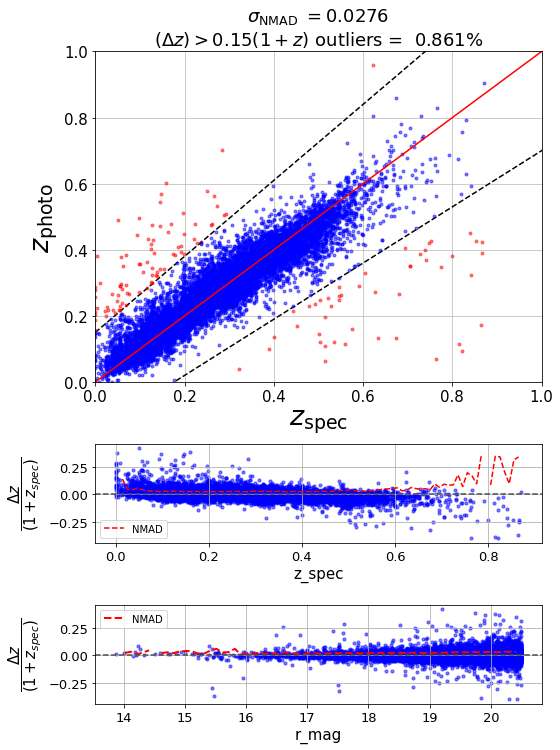

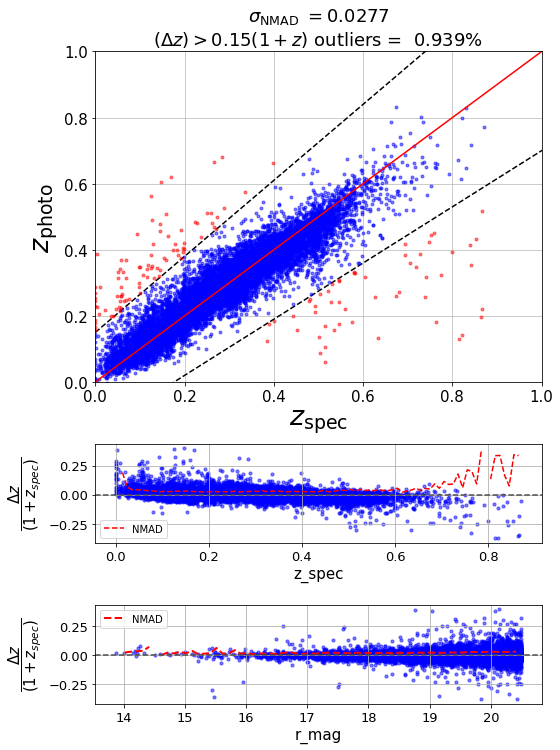

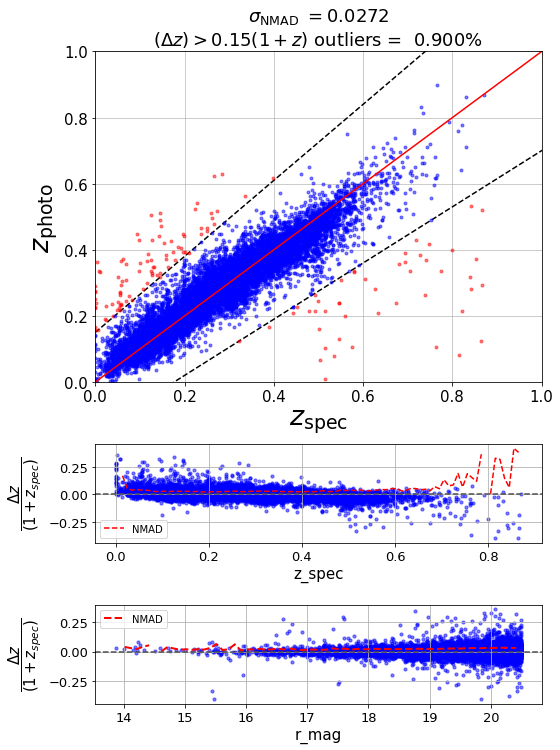

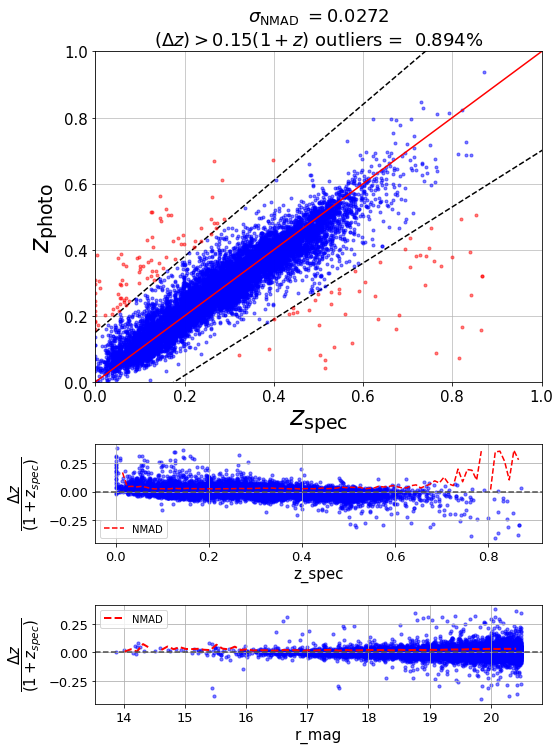

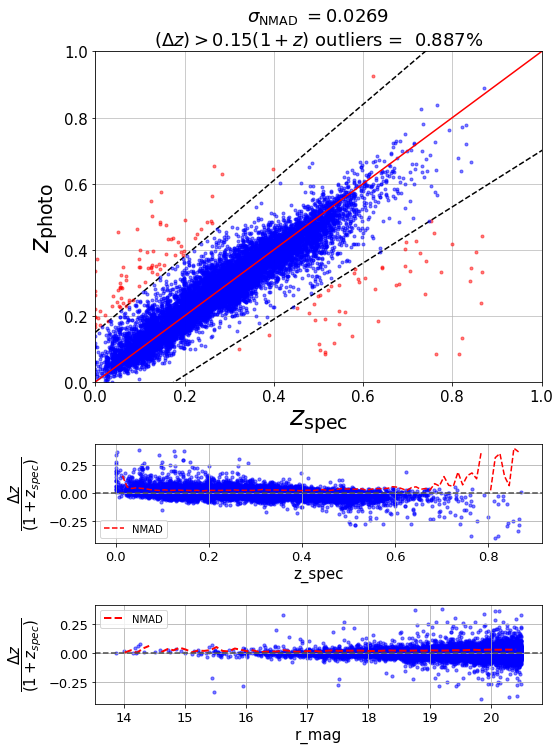

In [821]:
res6,zp6,zs6 = catboost(df_train,z_train,df_test,z_test,90)
res7,zp7,zs7 = catboost(df_train,z_train,df_test,z_test,100)
res8,zp8,zs8 = catboost(df_train,z_train,df_test,z_test,110)
res9,zp9,zs9 = catboost(df_train,z_train,df_test,z_test,120)
res10,zp10,zs10 = catboost(df_train,z_train,df_test,z_test,130)

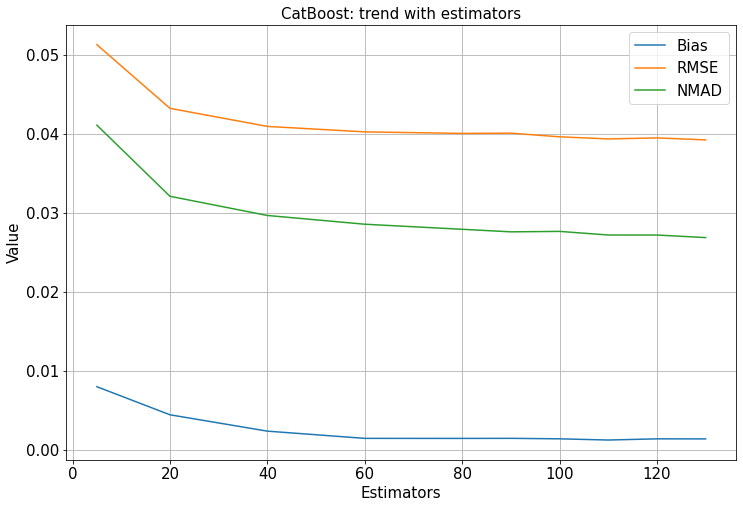

In [824]:
plt.figure(figsize=(12, 8))
f = 15
est = [5,20,40,60,80,90,100,110,120,130]
bias = [res1[1],res2[1],res3[1],res4[1],res5[1],res6[1],res7[1],res8[1],res9[1],res10[1]]
rmse = [res1[0],res2[0],res3[0],res4[0],res5[0],res6[0],res7[0],res8[0],res9[0],res10[0]]
nmad = [res1[6],res2[6],res3[6],res4[6],res5[6],res6[6],res7[6],res8[6],res9[6],res10[6]]
outl = [res1[7],res2[7],res3[7],res4[7],res5[7],res6[7],res7[7],res8[7],res9[7],res10[7]]
plt.plot(est,bias,label='Bias')
plt.plot(est,rmse,label='RMSE')
plt.plot(est,nmad,label='NMAD')
plt.title('CatBoost: trend with estimators',fontsize=15)
plt.xlabel('Estimators',fontsize=f)
plt.ylabel('Value',fontsize=f)
plt.xticks(fontsize=f)
plt.yticks(fontsize=f)
# plt.plot(est,outl,label='Outlier')
plt.legend(loc='best',fontsize=15)
plt.grid()

plt.savefig('catboost_perf.jpeg')

In [732]:
frames = [res1, res2,res3,res4,res5,res6,res7,res8,res9,res10]
colnames = ['res1', 'res2','res3','res4','res5','res6','res7','res8','res9','res10']
result = pd.concat(frames,axis=1)
result.columns = colnames
result
result.to_csv('catboost.csv')

In [ ]:
MAE: -0.046 (0.001)
MAE: -0.037 (0.000)
MAE: -0.035 (0.000)
MAE: -0.034 (0.000)
MAE: -0.033 (0.000)

MAE: -0.033 (0.001)
MAE: -0.033 (0.000)
MAE: -0.032 (0.000)
MAE: -0.032 (0.000)
MAE: -0.032 (0.000)


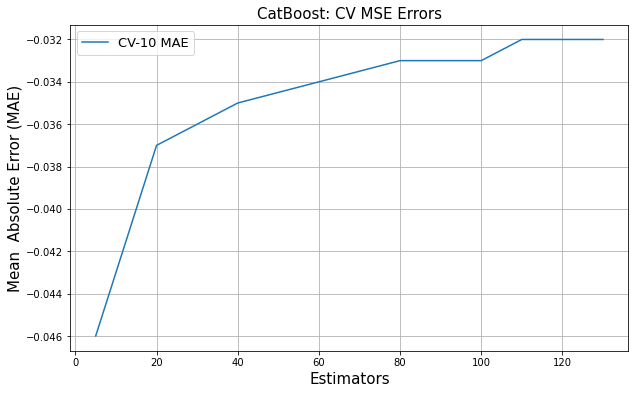

In [735]:
plt.figure(figsize=(10, 6))
est = [5,20,40,60,80,90,100,110,120,130]
mae = [-0.046,-0.037,-0.035,-0.034,-0.033,-0.033,-0.033,-0.032,-0.032,-0.032]

plt.plot(est,mae,label='CV-10 MAE')
plt.legend(loc='best',fontsize=13)
plt.xlabel('Estimators',fontsize=f)
plt.ylabel('Mean  Absolute Error (MAE)',fontsize=f)
plt.title('CatBoost: CV MSE Errors',fontsize=15)
plt.grid()

# plt.savefig('catboost_cv.jpeg',bbox_inches = 'tight')

### Method-3 Multi-Layer Perceptor (MLP) Regressor 

A multilayer perceptron (MLP) is a class of feedforward artificial neural network (ANN). The term MLP is used ambiguously, sometimes loosely to any feedforward ANN, sometimes strictly to refer to networks composed of multiple layers of perceptrons (with threshold activation). Multilayer perceptrons are sometimes colloquially referred to as "vanilla" neural networks, especially when they have a single hidden layer.

An MLP consists of at least three layers of nodes: an input layer, a hidden layer and an output layer. Except for the input nodes, each node is a neuron that uses a nonlinear activation function. MLP utilizes a supervised learning technique called backpropagation for training. Its multiple layers and non-linear activation distinguish MLP from a linear perceptron. It can distinguish data that is not linearly separable.

In [687]:
from sklearn.neural_network import MLPRegressor

def mlp(data,z,random_state,max_iter,ftrain,ftest):
    
    scaler = StandardScaler()
    scaler.fit(data)  
    scaled_data = scaler.transform(data)
    
    # uniformly weighting 10 nearest neighbors:
    # or weighting neighbors inversely proportional to their distance:
    
    data_train, data_test, z_train, z_test, scaled_train, scaled_test \
            =train_test_split(data, z, scaled_data, \
                        test_size = ftest, train_size = ftrain)
    
    i_mag = data_test[:,9]
    model = MLPRegressor(random_state=random_state, max_iter=max_iter)
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
    n_scores = cross_val_score(model, scaled_train, z_train, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1, error_score='raise')
    print('MAE: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

    # fit the model on the training dataset
    model.fit(scaled_train, z_train)

    # predict values for test data
    z_phot = model.predict(scaled_test)
    z_spec = z_test

    #Make a photo-z/spec-z plot and output summary statistics.
    result = plot_and_stats(z_spec,z_phot,i_mag)
    %timeit
    return(result,z_phot,z_spec)

MAE: -0.038 (0.005)
MAE: -0.037 (0.003)
MAE: -0.037 (0.002)
MAE: -0.036 (0.001)
MAE: -0.036 (0.001)


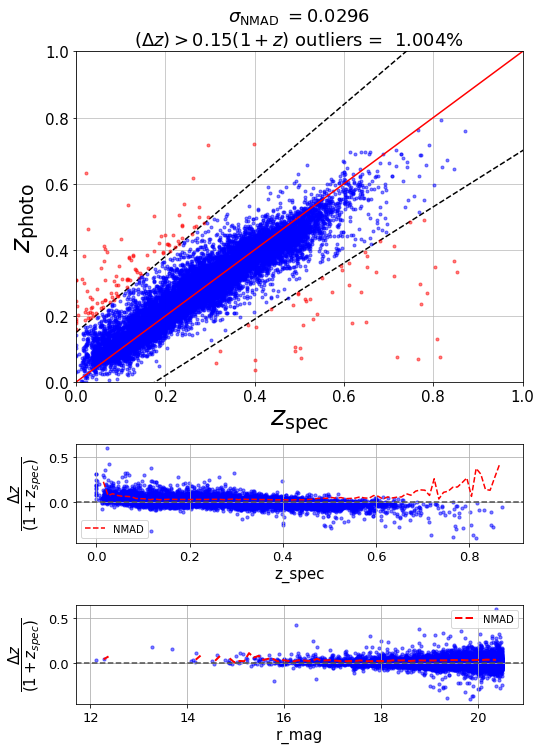

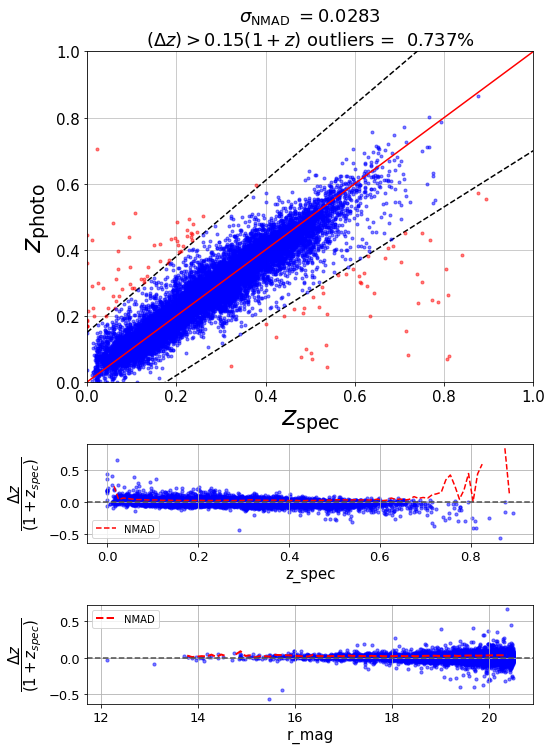

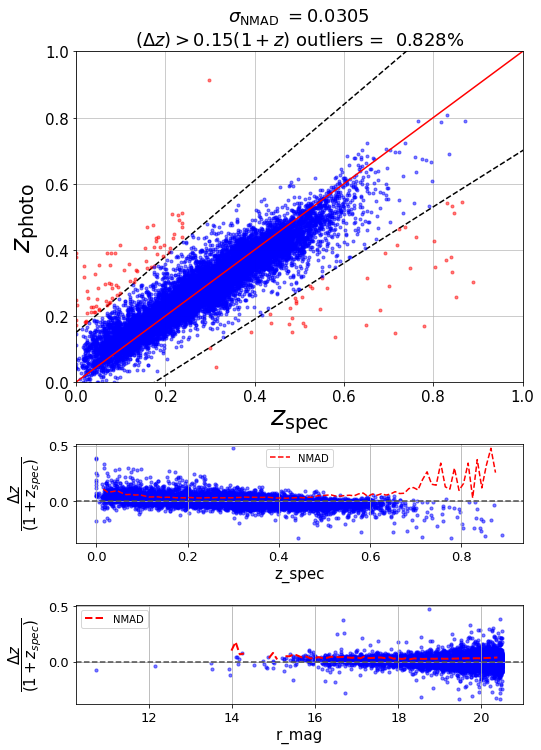

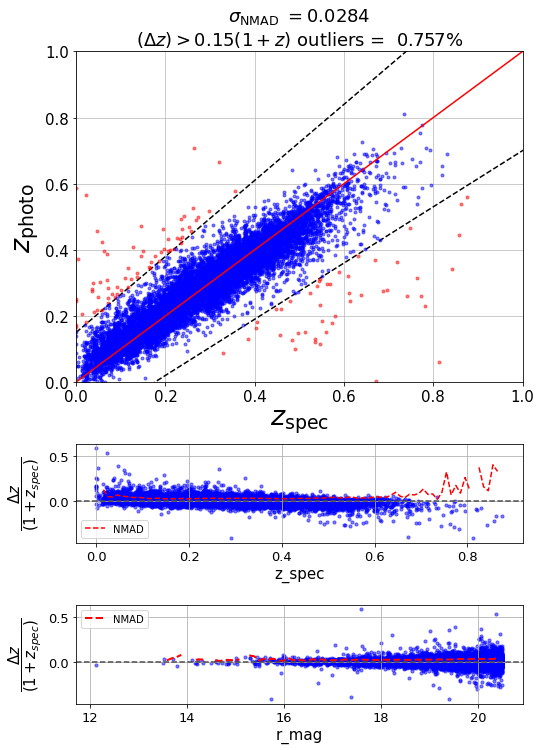

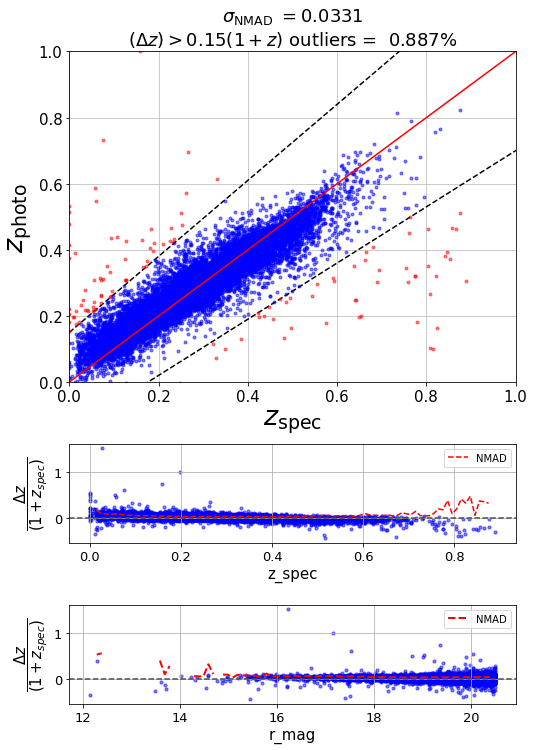

In [688]:
#trends with random state
res1,zp1,zs1 = mlp(data,z,1,200,0.8,0.2)
res2,zp2,zs2 = mlp(data,z,2,200,0.8,0.2)
res3,zp3,zs3 = mlp(data,z,3,200,0.8,0.2)
res4,zp4,zs4 = mlp(data,z,4,200,0.8,0.2)
res5,zp5,zs5 = mlp(data,z,5,200,0.8,0.2)

MAE: -0.037 (0.001)
MAE: -0.037 (0.002)
MAE: -0.037 (0.002)
MAE: -0.036 (0.001)
MAE: -0.037 (0.002)


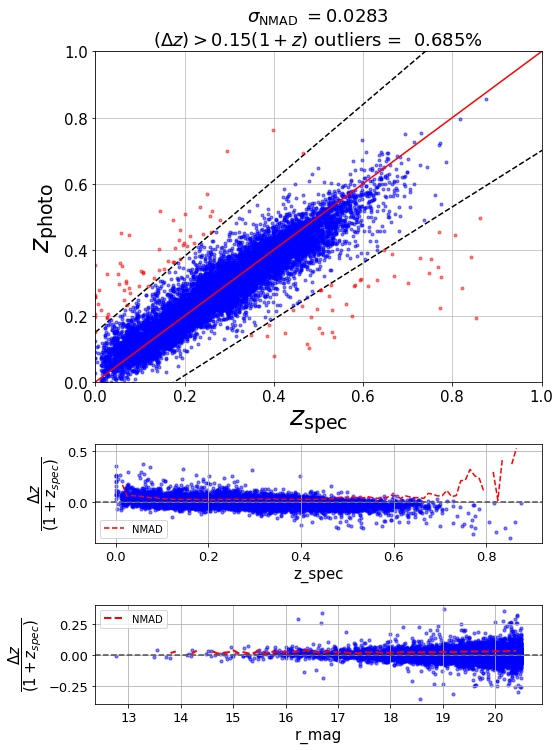

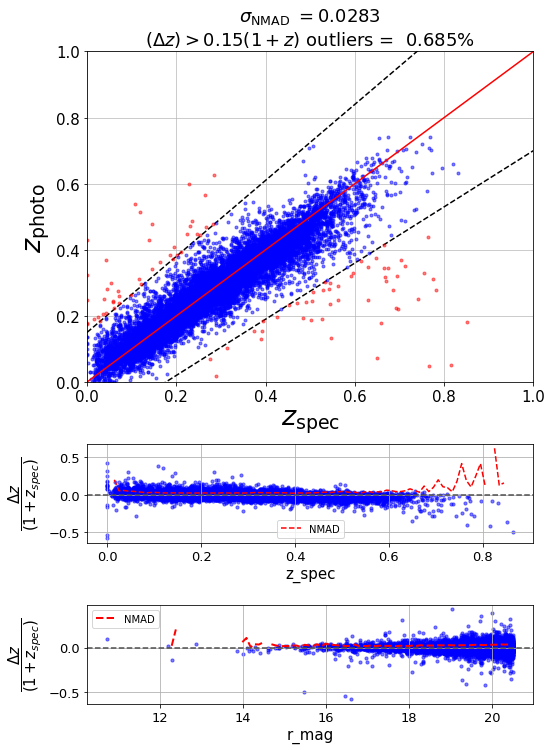

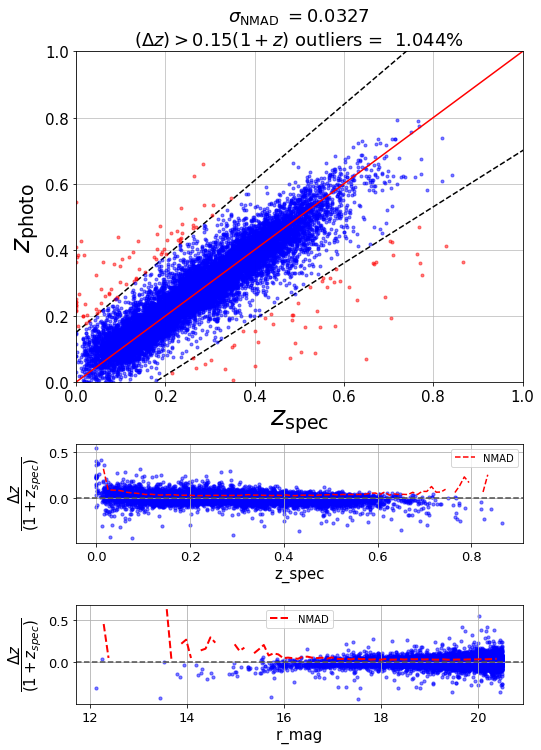

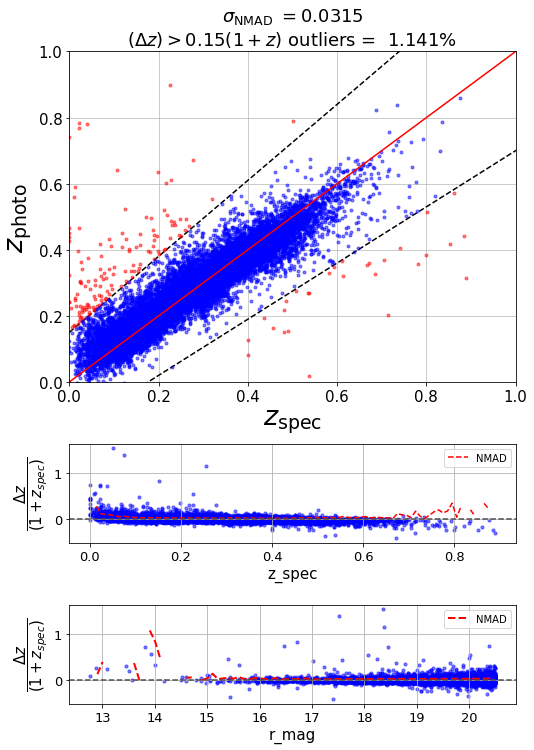

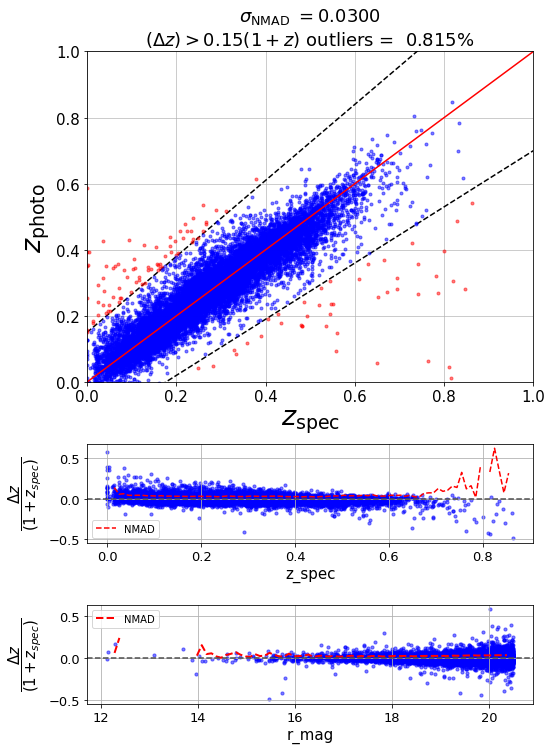

In [689]:
#trends with max_iterations
res6,zp6,zs6 = mlp(data,z,2,50,0.8,0.2)
res7,zp7,zs7 = mlp(data,z,2,100,0.8,0.2)
res8,zp8,zs8 = mlp(data,z,2,200,0.8,0.2)
res9,zp9,zs9 = mlp(data,z,2,300,0.8,0.2)
res10,zp10,zs10 = mlp(data,z,2,400,0.8,0.2)

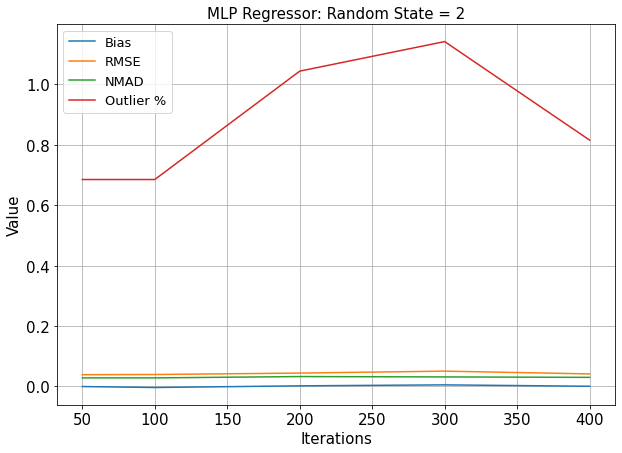

In [710]:
plt.figure(figsize=(10, 7))
f = 15
est = [1,2,3,4,5]
itr = [50,100,200,300,400]
# bias = [res1[1],res2[1],res3[1],res4[1],res5[1]]
# rmse = [res1[0],res2[0],res3[0],res4[0],res5[0]]
# nmad = [res1[6],res2[6],res3[6],res4[6],res5[6]]
# outl = [res1[7],res2[7],res3[7],res4[7],res5[7]]
# plt.plot(est,bias,label='Bias')
# plt.plot(est,rmse,label='RMSE')
# plt.plot(est,nmad,label='NMAD')
plt.title('MLP Regressor: Random State = 2',fontsize=15)
plt.xlabel('Iterations',fontsize=f)
plt.ylabel('Value',fontsize=f)
plt.xticks(fontsize=f)
plt.yticks(fontsize=f)
# plt.plot(est,outl,label='Outlier')
# plt.legend(loc='best',fontsize=15)
# plt.grid()

bias1 = [res6[1],res7[1],res8[1],res9[1],res10[1]]
rmse1 = [res6[0],res7[0],res8[0],res9[0],res10[0]]
nmad1 = [res6[6],res7[6],res8[6],res9[6],res10[6]]
outl1 = [res6[7],res7[7],res8[7],res9[7],res10[7]]
plt.plot(itr,bias1,label='Bias')
plt.plot(itr,rmse1,label='RMSE')
plt.plot(itr,nmad1,label='NMAD')
plt.plot(itr,outl1,label='Outlier %')
plt.legend(loc='best',fontsize=13)
plt.grid()

plt.savefig('mlp_iter_outliers.jpeg')

In [712]:
frames = [res1, res2,res3,res4,res5,res6,res7,res8,res9,res10]
colnames = ['res1', 'res2','res3','res4','res5','res6','res7','res8','res9','res10']
result = pd.concat(frames,axis=1)
result.columns = colnames
result
result.to_csv('mlp.csv')

### Method-4 Keras Regression based ANN 

In [825]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, BatchNormalization

In [826]:
scaler = StandardScaler()
scaler.fit(data)  
scaled_data = scaler.transform(data)
    
ftest=ftrain=0.5
data_train, data_test, z_train, z_test, scaled_train, scaled_test \
            =train_test_split(data, z, scaled_data, \
                        test_size = ftest, train_size = ftrain)

data_train[:,1]

array([2., 3., 4., ..., 1., 2., 3.])

In [827]:
def kerasreg(data,z,no_of_features,units,activation,batch_size,epochs,ftrain,ftest):   
    
    scaler = StandardScaler()
    scaler.fit(data)  
    scaled_data = scaler.transform(data)
    
    # uniformly weighting 10 nearest neighbors:
    # or weighting neighbors inversely proportional to their distance:
    
    data_train, data_test, z_train, z_test, scaled_train, scaled_test \
            =train_test_split(data, z, scaled_data, \
                        test_size = ftest, train_size = ftrain)
    
    i_mag = data_test[:,9]
    l2 = 0

    # Initialising the ANN
    model = Sequential()

    # Adding the input layer and the first hidden layer
    model.add(Dense(units = units, activation = activation, input_dim = no_of_features,kernel_regularizer=keras.regularizers.l2(l2)))

    # Adding the second hidden layer
    model.add(Dense(units = units, activation = activation,kernel_regularizer=keras.regularizers.l2(l2)))

    # Adding the third hidden layer
    model.add(Dense(units = units, activation = activation,kernel_regularizer=keras.regularizers.l2(l2)))

    # Adding the output layer
    model.add(Dense(units = 1,kernel_regularizer=keras.regularizers.l2(l2)))
    # model.summary()

    # fit the model on the training dataset
    model.compile(optimizer = 'adam',loss = 'mse', metrics=['mse','mae'])
    history = model.fit(scaled_train, z_train, batch_size = batch_size, epochs = epochs,validation_split=0.2)

    # predict values for test data
    z_phot = model.predict(scaled_test)
    z_phot = pd.Series([float(i) for i in z_phot])
    z_spec = z_test
    
    result = plot_and_stats(z_spec.values,z_phot.values,i_mag)
    %timeit
    return(result,z_phot.values,z_spec)

In [ ]:
from sklearn.metrics import mean_squared_error,median_absolute_error
from sklearn.model_selection import RepeatedKFold, cross_val_score
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

scaler = StandardScaler()
scaler.fit(data)  
scaled_data = scaler.transform(data)

data_train, data_test, z_train, z_test, scaled_train, scaled_test \
        =train_test_split(data, z, scaled_data, \
                    test_size = 0.2, train_size = 0.8)

i_mag = data_test[:,9]
l2 = 0

batch = [100,200,300,400,500,600,700,800]
units = [20,30,40,50,60,70,80]
epochs = [10,20,30,40,50,60,70,80,90,100]
activation = ['relu','sigmoid']
mse=np.copy(batch)*0.
mad=np.copy(batch)*0.

for i,n in enumerate(batch):
    # Initialising the ANN
    model = Sequential()

    # Adding the input layer and the first hidden layer
    model.add(Dense(units = units[2], activation = activation[0], input_dim = 22,kernel_regularizer=keras.regularizers.l2(l2)))

    # Adding the second hidden layer
    model.add(Dense(units = units[2], activation = activation[0],kernel_regularizer=keras.regularizers.l2(l2)))

    # Adding the third hidden layer
    model.add(Dense(units = units[2], activation = activation[0],kernel_regularizer=keras.regularizers.l2(l2)))

    # Adding the output layer
    model.add(Dense(units = 1,kernel_regularizer=keras.regularizers.l2(l2)))
    # model.summary()

    # fit the model on the training dataset
    model.compile(optimizer = 'adam',loss = 'mse', metrics=['mse','mae'])
#     history = model.fit(scaled_train, z_train, batch_size = n, epochs = 10,validation_split=0.2)
    
    estimator= KerasRegressor(build_fn=model, epochs=10, batch_size=n, verbose=0)
    kfold= RepeatedKFold(n_splits=5, n_repeats=100)
    results= cross_val_score(estimator, data, z, cv=kfold, n_jobs=2)  # 2 cpus
    mse[i] = mean_squared_error(z,results)
    mad[i]=median_absolute_error(z,results) 
        
plt.plot(ntree_test, mse,label='MSE')
plt.plot(ntree_test, mad,label='NMAD')
plt.legend()
plt.xlabel('Number of trees')

Epoch 1/10
246/246 [==============================] - ETA: 2:43 - loss: 0.1902 - mse: 0.1902 - mae: 0.376 - ETA: 0s - loss: 0.0579 - mse: 0.0579 - mae: 0.1755  - ETA: 0s - loss: 0.0413 - mse: 0.0413 - mae: 0.142 - ETA: 0s - loss: 0.0331 - mse: 0.0331 - mae: 0.124 - ETA: 0s - loss: 0.0279 - mse: 0.0279 - mae: 0.112 - 1s 3ms/step - loss: 0.0251 - mse: 0.0251 - mae: 0.1059 - val_loss: 0.0051 - val_mse: 0.0051 - val_mae: 0.0505
Epoch 2/10
246/246 [==============================] - ETA: 0s - loss: 0.0040 - mse: 0.0040 - mae: 0.047 - ETA: 0s - loss: 0.0047 - mse: 0.0047 - mae: 0.049 - ETA: 0s - loss: 0.0047 - mse: 0.0047 - mae: 0.049 - ETA: 0s - loss: 0.0047 - mse: 0.0047 - mae: 0.049 - ETA: 0s - loss: 0.0047 - mse: 0.0047 - mae: 0.049 - ETA: 0s - loss: 0.0046 - mse: 0.0046 - mae: 0.048 - 0s 1ms/step - loss: 0.0046 - mse: 0.0046 - mae: 0.0489 - val_loss: 0.0041 - val_mse: 0.0041 - val_mae: 0.0446
Epoch 3/10
246/246 [==============================] - ETA: 0s - loss: 0.0067 - mse: 0.0067 - mae

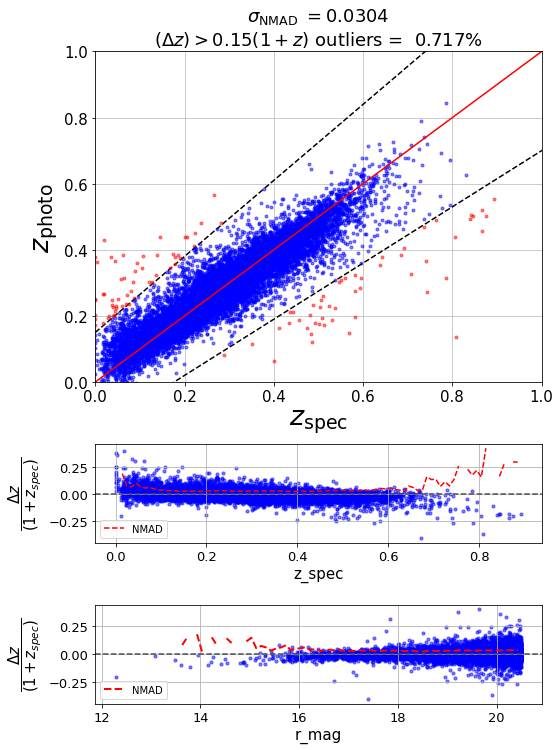

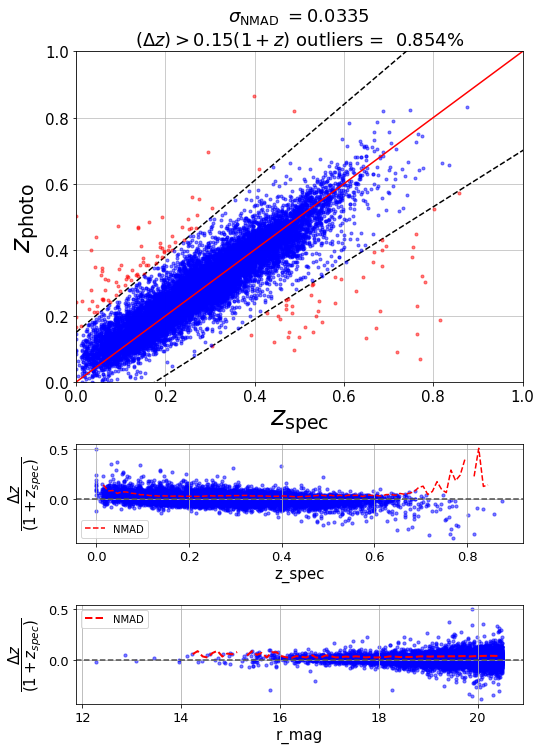

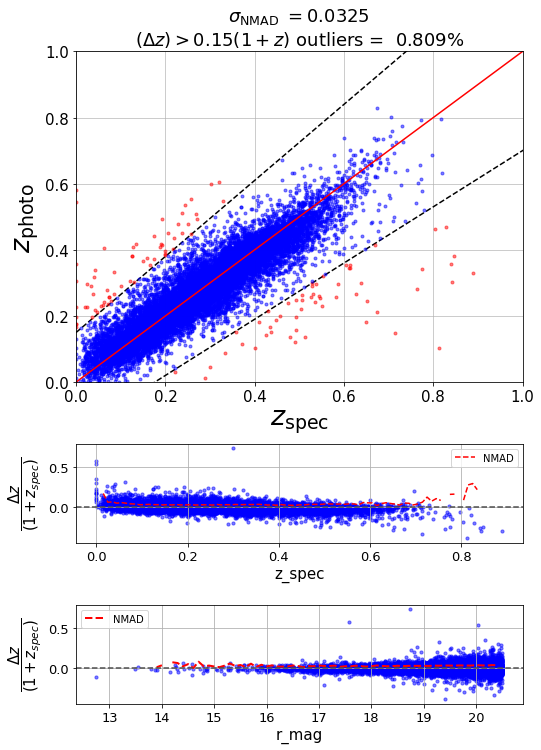

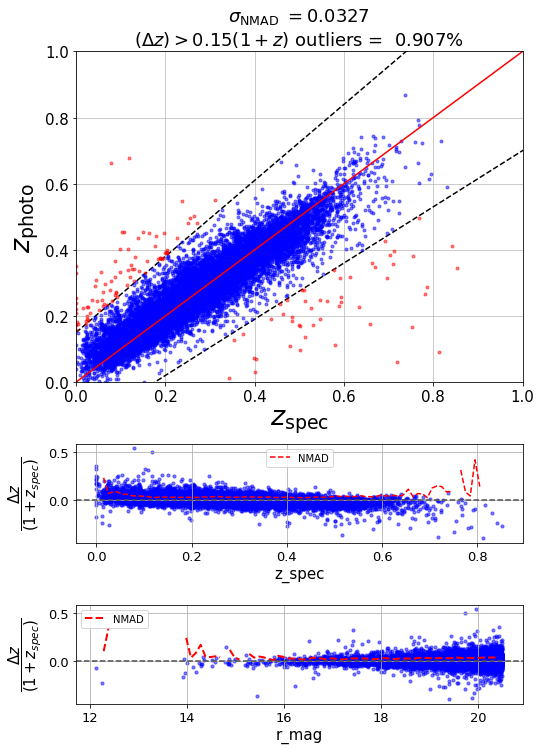

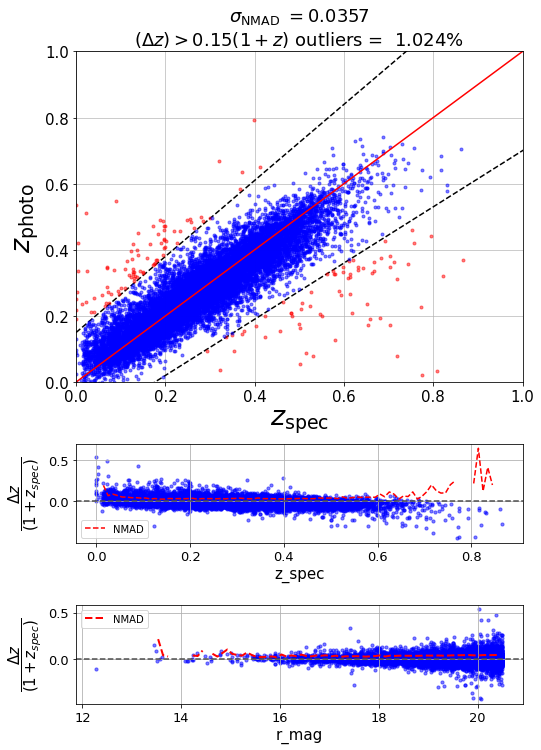

In [828]:
#trends with batch size
res1,zp1,zs1 = kerasreg(data,z,22,50,'relu',200,10,0.8,0.2)
res2,zp2,zs2 = kerasreg(data,z,22,50,'relu',400,10,0.8,0.2)
res3,zp3,zs3 = kerasreg(data,z,22,50,'relu',600,10,0.8,0.2)
res4,zp4,zs4 = kerasreg(data,z,22,50,'relu',800,10,0.8,0.2)
res5,zp5,zs5 = kerasreg(data,z,22,50,'relu',1000,10,0.8,0.2)

Epoch 1/10
246/246 [==============================] - ETA: 1:18 - loss: 0.2026 - mse: 0.2026 - mae: 0.408 - ETA: 0s - loss: 0.0560 - mse: 0.0560 - mae: 0.1709  - ETA: 0s - loss: 0.0411 - mse: 0.0411 - mae: 0.140 - ETA: 0s - loss: 0.0331 - mse: 0.0331 - mae: 0.123 - ETA: 0s - loss: 0.0284 - mse: 0.0284 - mae: 0.112 - 1s 2ms/step - loss: 0.0257 - mse: 0.0257 - mae: 0.1057 - val_loss: 0.0048 - val_mse: 0.0048 - val_mae: 0.0502
Epoch 2/10
246/246 [==============================] - ETA: 0s - loss: 0.0053 - mse: 0.0053 - mae: 0.053 - ETA: 0s - loss: 0.0046 - mse: 0.0046 - mae: 0.049 - ETA: 0s - loss: 0.0047 - mse: 0.0047 - mae: 0.049 - ETA: 0s - loss: 0.0046 - mse: 0.0046 - mae: 0.048 - ETA: 0s - loss: 0.0045 - mse: 0.0045 - mae: 0.048 - 0s 1ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0479 - val_loss: 0.0038 - val_mse: 0.0038 - val_mae: 0.0432
Epoch 3/10
246/246 [==============================] - ETA: 0s - loss: 0.0036 - mse: 0.0036 - mae: 0.043 - ETA: 0s - loss: 0.0037 - mse: 0.0037 - mae

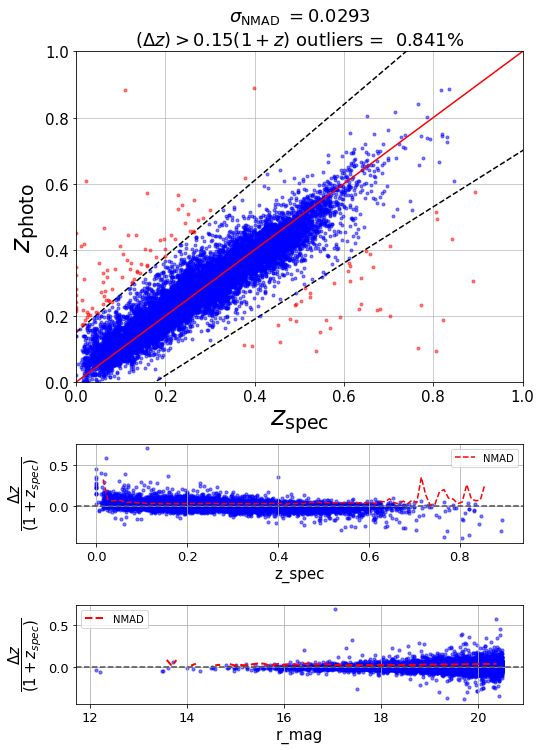

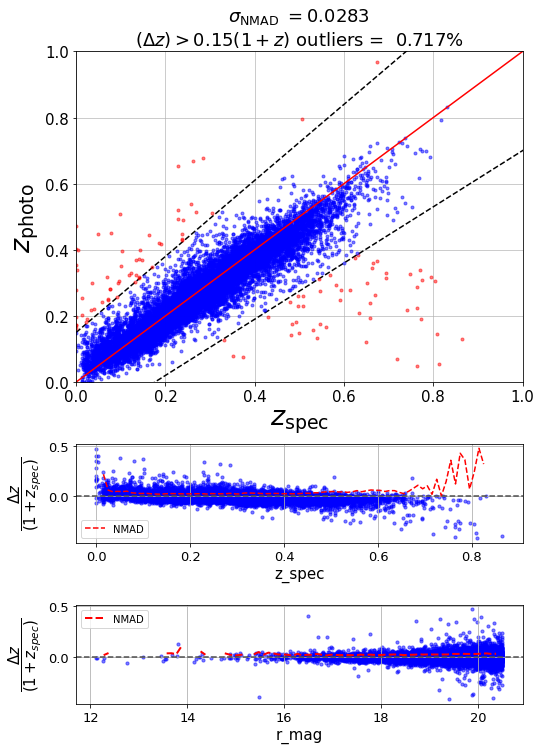

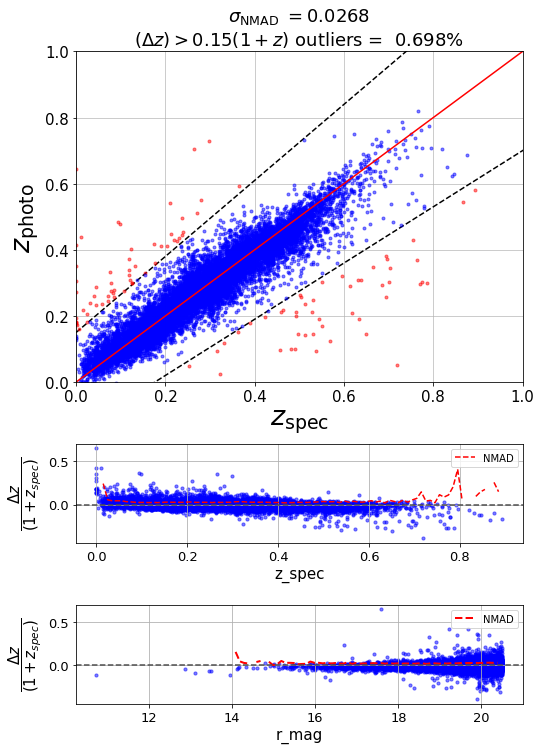

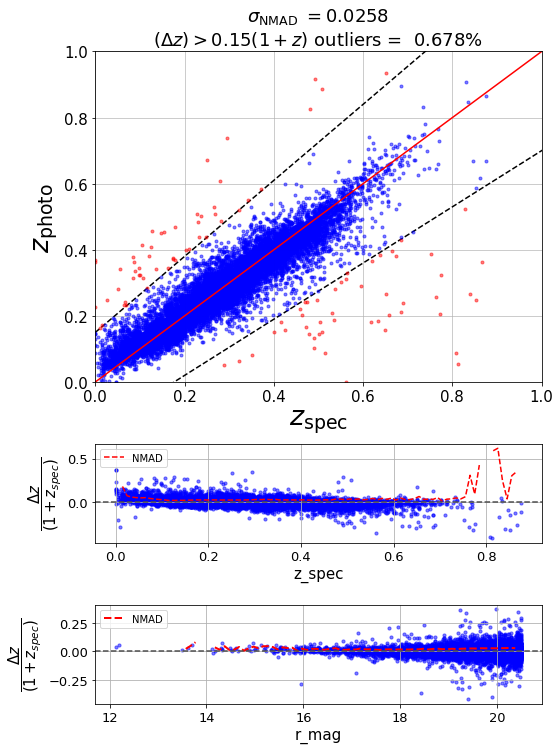

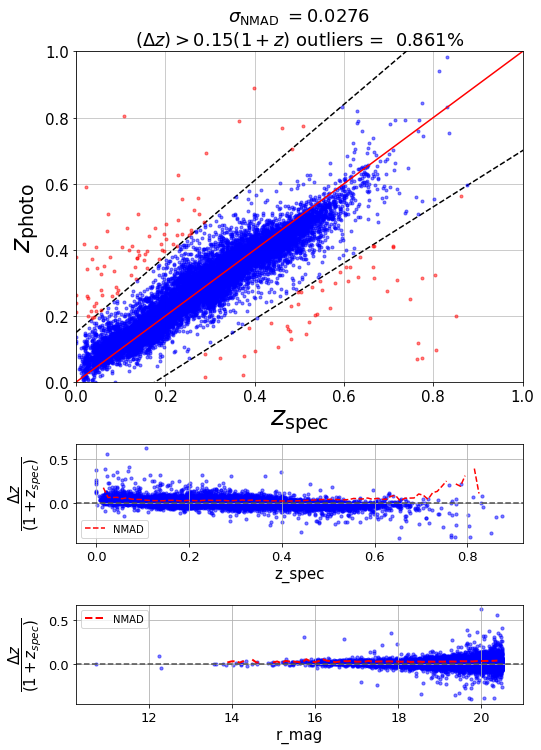

In [830]:
#trends with epochs
res6,zp6,zs6 = kerasreg(data,z,22,50,'relu',200,10,0.8,0.2)
res7,zp7,zs7 = kerasreg(data,z,22,50,'relu',200,20,0.8,0.2)
res8,zp8,zs8 = kerasreg(data,z,22,50,'relu',200,30,0.8,0.2)
res9,zp9,zs9 = kerasreg(data,z,22,50,'relu',200,40,0.8,0.2)
res10,zp10,zs10 = kerasreg(data,z,22,50,'relu',200,50,0.8,0.2)

Epoch 1/40
246/246 [==============================] - ETA: 1:19 - loss: 0.1255 - mse: 0.1255 - mae: 0.286 - ETA: 0s - loss: 0.0458 - mse: 0.0458 - mae: 0.1566  - ETA: 0s - loss: 0.0330 - mse: 0.0330 - mae: 0.128 - ETA: 0s - loss: 0.0271 - mse: 0.0271 - mae: 0.114 - ETA: 0s - loss: 0.0234 - mse: 0.0234 - mae: 0.104 - 1s 2ms/step - loss: 0.0227 - mse: 0.0227 - mae: 0.1027 - val_loss: 0.0049 - val_mse: 0.0049 - val_mae: 0.0498
Epoch 2/40
246/246 [==============================] - ETA: 0s - loss: 0.0050 - mse: 0.0050 - mae: 0.047 - ETA: 0s - loss: 0.0050 - mse: 0.0050 - mae: 0.050 - ETA: 0s - loss: 0.0048 - mse: 0.0048 - mae: 0.049 - ETA: 0s - loss: 0.0047 - mse: 0.0047 - mae: 0.048 - ETA: 0s - loss: 0.0046 - mse: 0.0046 - mae: 0.048 - 1s 2ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0481 - val_loss: 0.0041 - val_mse: 0.0041 - val_mae: 0.0453
Epoch 3/40
246/246 [==============================] - ETA: 0s - loss: 0.0042 - mse: 0.0042 - mae: 0.045 - ETA: 0s - loss: 0.0038 - mse: 0.0038 - mae

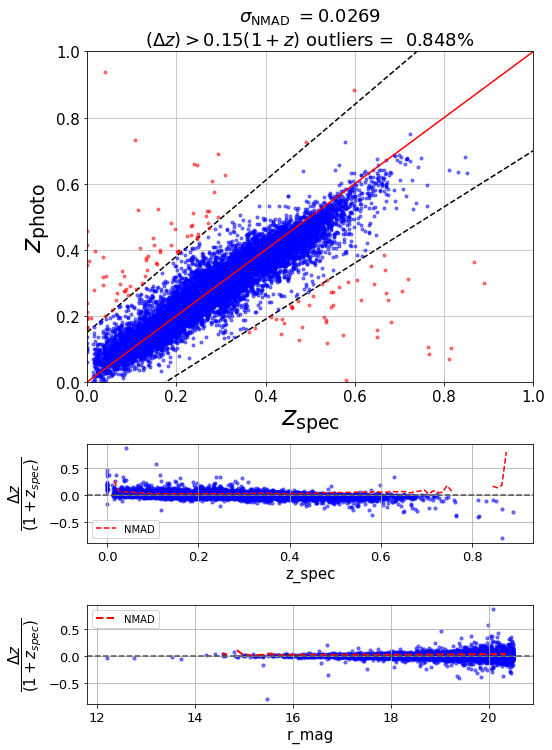

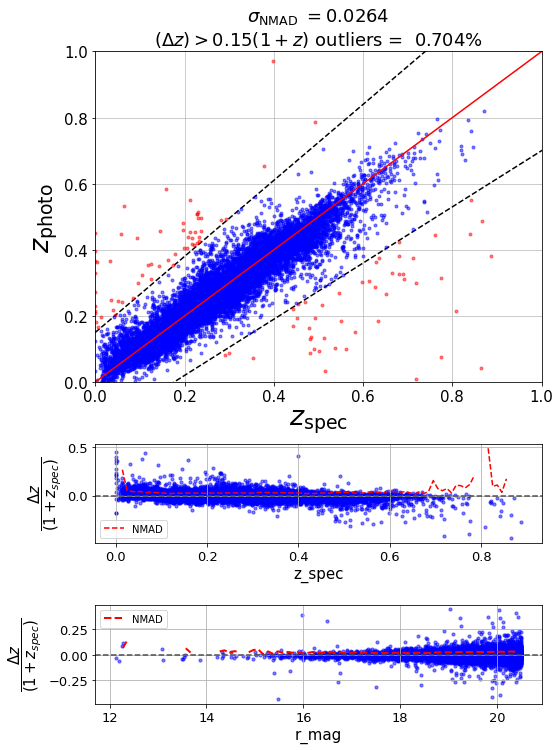

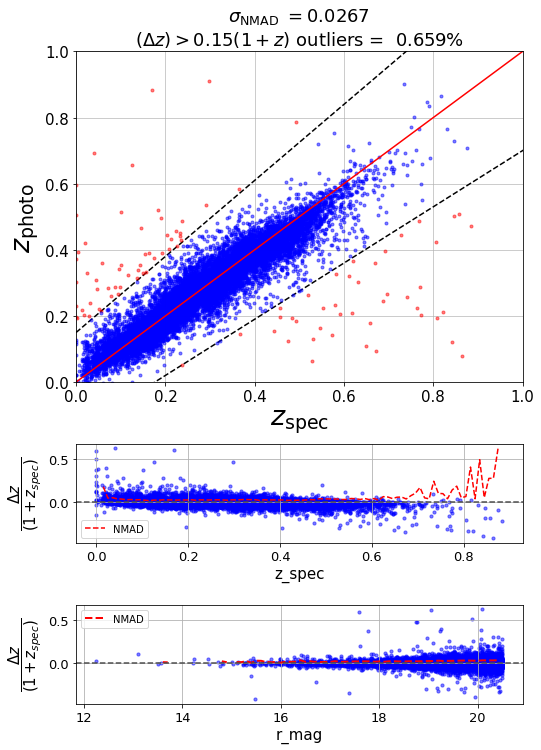

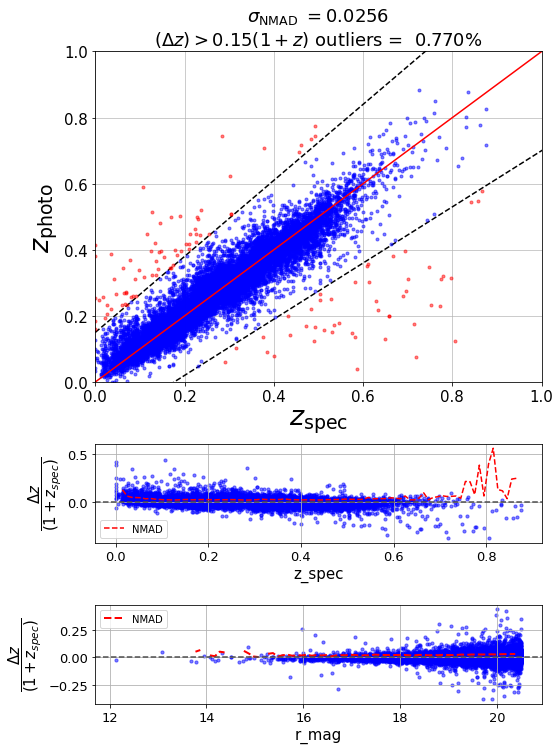

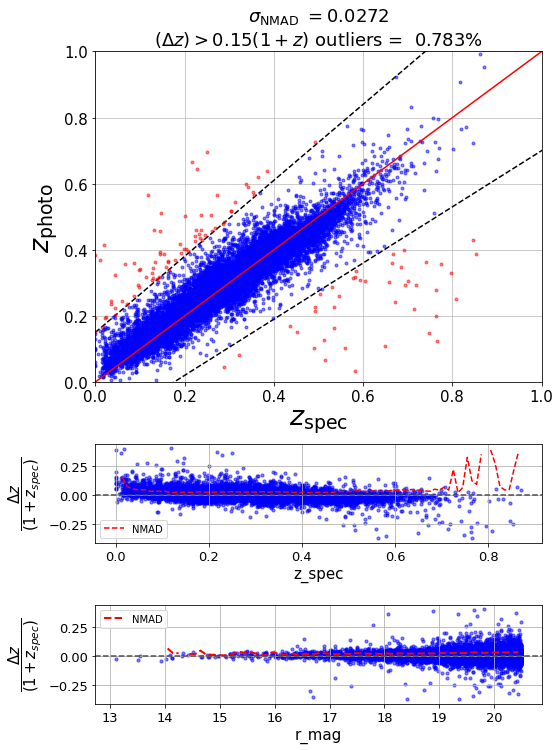

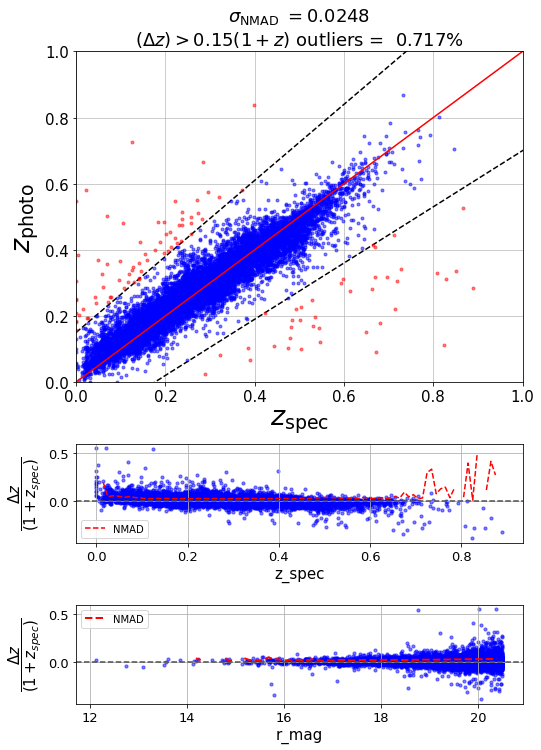

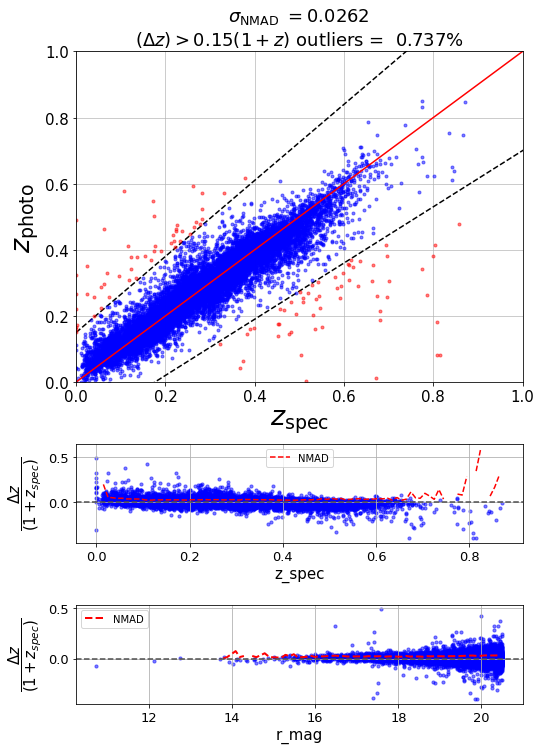

In [831]:
#trends with units
res1a,zp1a,zs1a = kerasreg(data,z,22,40,'relu',200,40,0.8,0.2)
res2a,zp2a,zs2a = kerasreg(data,z,22,50,'relu',200,40,0.8,0.2)
res3a,zp3a,zs3a = kerasreg(data,z,22,60,'relu',200,40,0.8,0.2)
res4a,zp4a,zs4a = kerasreg(data,z,22,70,'relu',200,40,0.8,0.2)
res5a,zp5a,zs5a = kerasreg(data,z,22,80,'relu',200,40,0.8,0.2)
res6a,zp6a,zs6a = kerasreg(data,z,22,90,'relu',200,40,0.8,0.2)
res7a,zp7a,zs7a = kerasreg(data,z,22,100,'relu',200,40,0.8,0.2)

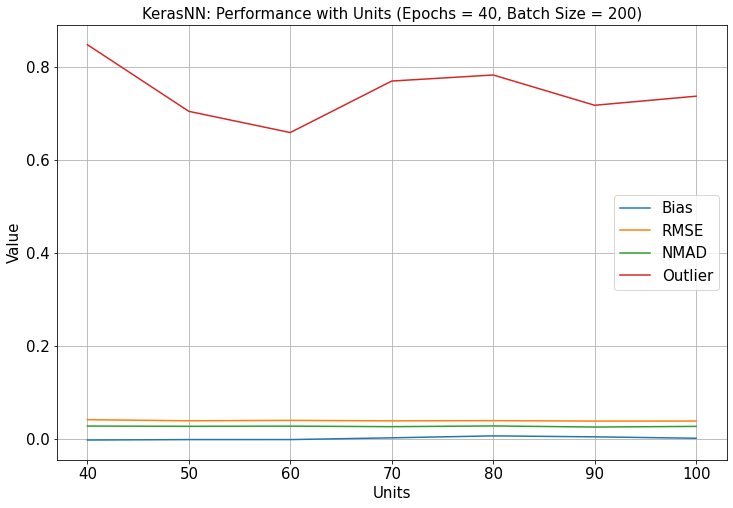

In [836]:
plt.figure(figsize=(12, 8))
f = 15
batch = [200,400,600,800,1000]
units = [40,50,60,70,80,90,100]
epochs = [10,20,30,40,50]
activation = ['relu','sigmoid']
bias = [res1a[1],res2a[1],res3a[1],res4a[1],res5a[1],res6a[1],res7a[1]]
rmse = [res1a[0],res2a[0],res3a[0],res4a[0],res5a[0], res6a[0],res7a[0]]
nmad = [res1a[6],res2a[6],res3a[6],res4a[6],res5a[6], res6a[6],res7a[6]]
outl = [res1a[7],res2a[7],res3a[7],res4a[7],res5a[7],res6a[7],res7a[7]]
# bias = [res1[1],res2[1],res3[1],res4[1],res5[1]]
# rmse = [res1[0],res2[0],res3[0],res4[0],res5[0]]
# nmad = [res1[6],res2[6],res3[6],res4[6],res5[6]]
# outl = [res1[7],res2[7],res3[7],res4[7],res5[7]]
plt.plot(units,bias,label='Bias')
plt.plot(units,rmse,label='RMSE')
plt.plot(units,nmad,label='NMAD')
plt.title('KerasNN: Performance with Units (Epochs = 40, Batch Size = 200)',fontsize=15)
plt.xlabel('Units',fontsize=f)
plt.ylabel('Value',fontsize=f)
plt.xticks(fontsize=f)
plt.yticks(fontsize=f)
plt.plot(units,outl,label='Outlier')
plt.legend(loc='best',fontsize=15)
plt.grid()

plt.savefig('keras_units_out.jpeg')

In [755]:
frames = [res1, res2,res3,res4,res5,res6,res7,res8,res9,res10,res1a,res2a,res3a,res4a,res5a,res6a,res7a]
colnames = ['res1', 'res2','res3','res4','res5','res6','res7','res8','res9','res10','res1a','res2a','res3a','res4a','res5a','res6a','res7a']
result = pd.concat(frames,axis=1)
result.columns = colnames
result
result.to_csv('keras.csv')

dict_keys(['loss', 'mse', 'mae', 'val_loss', 'val_mse', 'val_mae'])


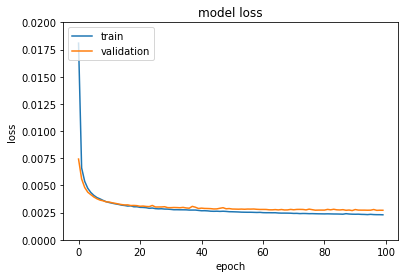

In [365]:
print(history.history.keys())
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
# plt.savefig('epochsKeras_Loss.png')
plt.ylim(0,0.02)
plt.show()


### Method-5 GP Regressor

In [192]:
import math
import torch
import gpytorch
import tqdm
import tensorflow as tf


In [765]:
def gpr(data,z,training_iterations,ftrain,ftest):

    scaler = StandardScaler()
    scaler.fit(data)  
    scaled_data = scaler.transform(data)
    
    data_train, data_test, z_train, z_test, scaled_train, scaled_test \
            =train_test_split(data, z, scaled_data, \
                        test_size = ftest, train_size = ftrain)
    
    i_mag = data_test[:,9]

    train_x = torch.from_numpy(numpy.array(scaled_train)).float()
    train_y = torch.from_numpy(numpy.array(z_train)).float()
    test_x = torch.from_numpy(numpy.array(scaled_test)).float()
    test_y = torch.from_numpy(numpy.array(z_test)).float()

    if torch.cuda.is_available():
        train_x, train_y, test_x, test_y = train_x.cuda(), train_y.cuda(), test_x.cuda(), test_y.cuda()
        
    class LargeFeatureExtractor(torch.nn.Sequential):           
        def __init__(self, input_dim):                                      
            super(LargeFeatureExtractor, self).__init__()        
            self.add_module('linear1', torch.nn.Linear(input_dim, 1000))
            self.add_module('relu1', torch.nn.ReLU())                  
            self.add_module('linear2', torch.nn.Linear(1000, 500))     
            self.add_module('relu2', torch.nn.ReLU())                  
            self.add_module('linear3', torch.nn.Linear(500, 50))       
            self.add_module('relu3', torch.nn.ReLU())                  
            self.add_module('linear4', torch.nn.Linear(50, 2))         


    class GPRegressionModel(gpytorch.models.ExactGP):
        def __init__(self, train_x, train_y, likelihood):
            super(GPRegressionModel, self).__init__(train_x, train_y, likelihood)

            self.mean_module = gpytorch.means.ConstantMean()
            self.covar_module = gpytorch.kernels.GridInterpolationKernel(
                gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel()),
                grid_size=200, num_dims=2,
            )

            # Also add the deep net
            self.feature_extractor = LargeFeatureExtractor(input_dim=train_x.size(-1))

        def forward(self, x):
            # We're first putting our data through a deep net (feature extractor)
            # We're also scaling the features so that they're nice values
            projected_x = self.feature_extractor(x)
            projected_x = projected_x - projected_x.min(0)[0]
            projected_x = 2 * (projected_x / projected_x.max(0)[0]) - 1

            # The rest of this looks like what we've seen
            mean_x = self.mean_module(projected_x)
            covar_x = self.covar_module(projected_x)
            return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)


    likelihood = gpytorch.likelihoods.GaussianLikelihood()
    model = GPRegressionModel(train_x, train_y, likelihood)

    if torch.cuda.is_available():
        model = model.cuda()
        likelihood = likelihood.cuda()
        
    training_iterations = training_iterations

    # Find optimal model hyperparameters
    model.train()
    likelihood.train()

    # Use the adam optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=0.1)  # Includes GaussianLikelihood parameters

    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)


    def train():
        iterator = tqdm.notebook.tqdm(range(training_iterations))
        for i in iterator:
            optimizer.zero_grad()
            output = model(train_x)
            loss = -mll(output, train_y)
            loss.backward()
            iterator.set_postfix(loss=loss.item())
            optimizer.step()

    train()
    
    # Clear the cache from the previous computations
    model.train()
    likelihood.train()

    # Set into eval mode
    model.eval()
    likelihood.eval()

    with torch.no_grad(), gpytorch.settings.fast_pred_var(), gpytorch.settings.max_root_decomposition_size(100):
        start_time = time.time()
        preds = likelihood(model(test_x))
        fast_time_no_cache = time.time() - start_time
        lower, upper = preds.confidence_region()
    
    print(lower.numpy(),upper.numpy())
    preds50 = preds.mean.numpy()
    result = plot_and_stats(z_test,preds50,i_mag)
    return(result,preds50,z_test)


ExactMarginalLogLikelihood(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (model): GPRegressionModel(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (covar_module): GridInterpolationKernel(
      (base_kernel): ScaleKernel(
        (base_kernel): RBFKernel(
          (raw_lengthscale_constraint): Positive()
          (distance_module): Distance()
        )
        (raw_outputscale_constraint): Positive()
      )
    )
    (feature_extractor): LargeFeatureExtractor(
      (linear1): Linear(in_features=22, out_features=1000, bias=True)
      (relu1): ReLU()
      (linear2): Linear(in_features=1000, out_features=500, bias=True)
      (relu2): ReLU()
      (linear3): Linear(in_features=500, out_features=50, bias=True)
      (relu3): ReLU()
      (linear4): Lin


ExactMarginalLogLikelihood(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (model): GPRegressionModel(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (covar_module): GridInterpolationKernel(
      (base_kernel): ScaleKernel(
        (base_kernel): RBFKernel(
          (raw_lengthscale_constraint): Positive()
          (distance_module): Distance()
        )
        (raw_outputscale_constraint): Positive()
      )
    )
    (feature_extractor): LargeFeatureExtractor(
      (linear1): Linear(in_features=22, out_features=1000, bias=True)
      (relu1): ReLU()
      (linear2): Linear(in_features=1000, out_features=500, bias=True)
      (relu2): ReLU()
      (linear3): Linear(in_features=500, out_features=50, bias=True)
      (relu3): ReLU()
      (linear4): Lin


ExactMarginalLogLikelihood(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (model): GPRegressionModel(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (covar_module): GridInterpolationKernel(
      (base_kernel): ScaleKernel(
        (base_kernel): RBFKernel(
          (raw_lengthscale_constraint): Positive()
          (distance_module): Distance()
        )
        (raw_outputscale_constraint): Positive()
      )
    )
    (feature_extractor): LargeFeatureExtractor(
      (linear1): Linear(in_features=22, out_features=1000, bias=True)
      (relu1): ReLU()
      (linear2): Linear(in_features=1000, out_features=500, bias=True)
      (relu2): ReLU()
      (linear3): Linear(in_features=500, out_features=50, bias=True)
      (relu3): ReLU()
      (linear4): Lin


ExactMarginalLogLikelihood(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (model): GPRegressionModel(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (covar_module): GridInterpolationKernel(
      (base_kernel): ScaleKernel(
        (base_kernel): RBFKernel(
          (raw_lengthscale_constraint): Positive()
          (distance_module): Distance()
        )
        (raw_outputscale_constraint): Positive()
      )
    )
    (feature_extractor): LargeFeatureExtractor(
      (linear1): Linear(in_features=22, out_features=1000, bias=True)
      (relu1): ReLU()
      (linear2): Linear(in_features=1000, out_features=500, bias=True)
      (relu2): ReLU()
      (linear3): Linear(in_features=500, out_features=50, bias=True)
      (relu3): ReLU()
      (linear4): Lin

/Users/yashakaushal/opt/anaconda3/lib/python3.7/site-packages/gpytorch/utils/linear_cg.py:327: NumericalWarning: CG terminated in 1000 iterations with average residual norm 0.2706086039543152 which is larger than the tolerance of 0.01 specified by gpytorch.settings.cg_tolerance. If performance is affected, consider raising the maximum number of CG iterations by running code in a gpytorch.settings.max_cg_iterations(value) context.
  NumericalWarning,
/Users/yashakaushal/opt/anaconda3/lib/python3.7/site-packages/gpytorch/distributions/multivariate_normal.py:263: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  NumericalWarning,


ExactMarginalLogLikelihood(
  (likelihood): GaussianLikelihood(
    (noise_covar): HomoskedasticNoise(
      (raw_noise_constraint): GreaterThan(1.000E-04)
    )
  )
  (model): GPRegressionModel(
    (likelihood): GaussianLikelihood(
      (noise_covar): HomoskedasticNoise(
        (raw_noise_constraint): GreaterThan(1.000E-04)
      )
    )
    (mean_module): ConstantMean()
    (covar_module): GridInterpolationKernel(
      (base_kernel): ScaleKernel(
        (base_kernel): RBFKernel(
          (raw_lengthscale_constraint): Positive()
          (distance_module): Distance()
        )
        (raw_outputscale_constraint): Positive()
      )
    )
    (feature_extractor): LargeFeatureExtractor(
      (linear1): Linear(in_features=22, out_features=1000, bias=True)
      (relu1): ReLU()
      (linear2): Linear(in_features=1000, out_features=500, bias=True)
      (relu2): ReLU()
      (linear3): Linear(in_features=500, out_features=50, bias=True)
      (relu3): ReLU()
      (linear4): Line

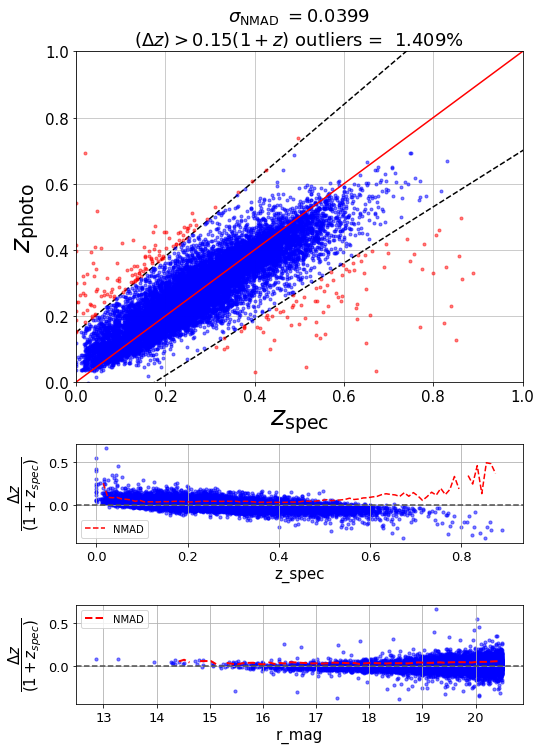

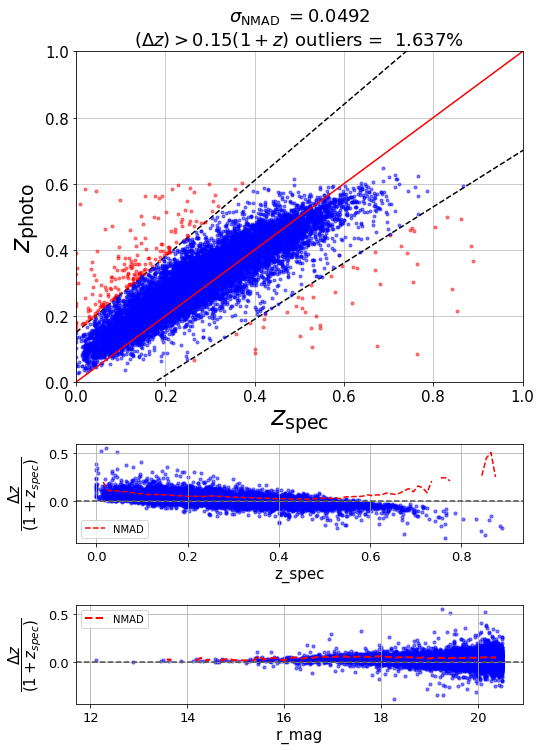

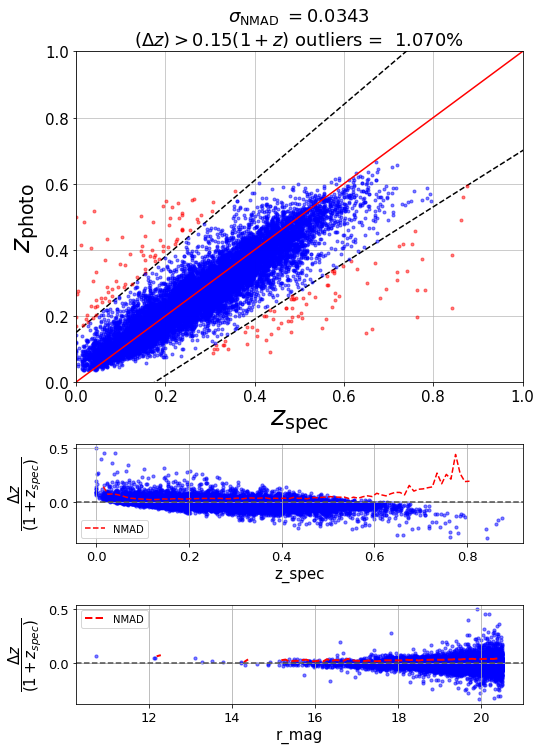

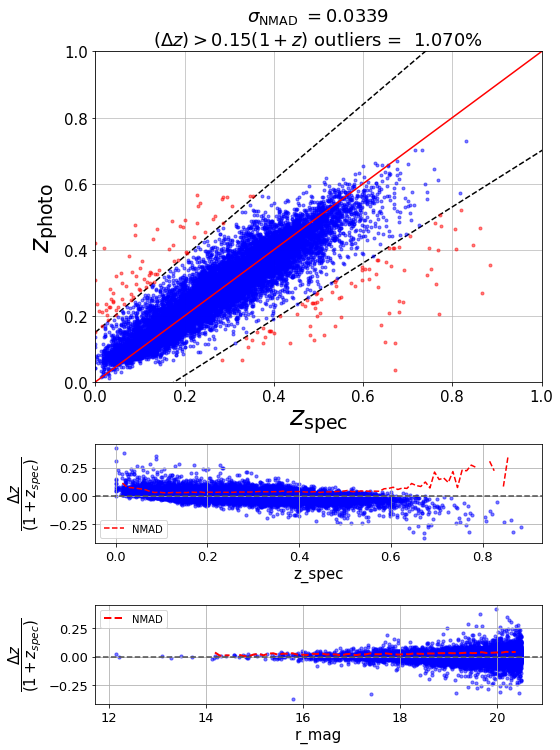

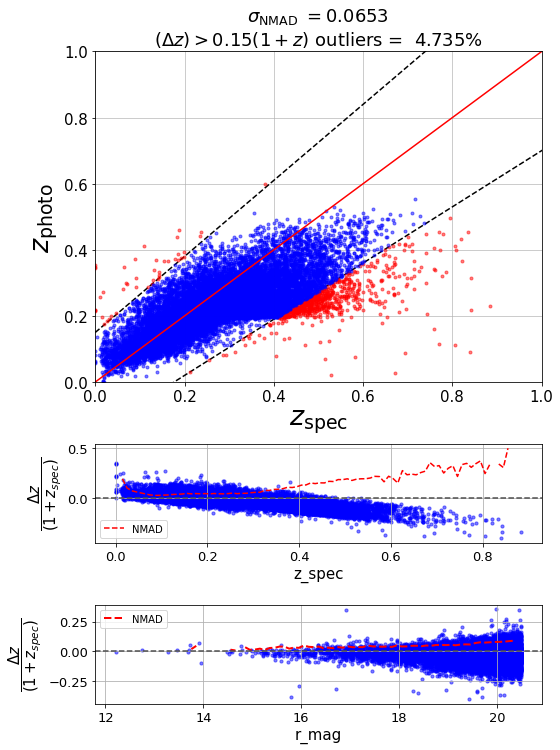

In [760]:
# result= gpr(data,z,1,0.8,0.2)

#trends with training iterations , grid_size=100
res1,zp1,zs1 = gpr(data,z,10,0.8,0.2)
res2,zp2,zs2 = gpr(data,z,20,0.8,0.2)
res3,zp3,zs3 = gpr(data,z,30,0.8,0.2)
res4,zp4,zs4 = gpr(data,z,40,0.8,0.2)
res5,zp5,zs5 = gpr(data,z,50,0.8,0.2)



[-0.8997154  -0.69780314 -0.91540766 ... -0.84706575 -0.84627324
 -0.6679541 ] [1.3114464 1.5150055 1.2948225 ... 1.3660004 1.3682439 1.5436121]



[-0.43443814 -0.33974963 -0.3114069  ... -0.61095536 -0.45781732
 -0.23991904] [0.9670942  1.0617025  1.09023    ... 0.7908437  0.94363034 1.16162   ]



[-0.26435906 -0.21117088 -0.27728358 ... -0.10951412 -0.13366914
 -0.03084856] [0.58703744 0.64018846 0.5741093  ... 0.74185973 0.71771365 0.82057095]



[ 0.09245184  0.31508917 -0.09499551 ...  0.16156873 -0.11327048
 -0.00727925] [0.60639465 0.82937235 0.41897583 ... 0.67553675 0.40067023 0.5066471 ]



[ 0.17633995  0.35560066 -0.03282052 ...  0.1263813  -0.04509898
  0.20876952] [0.50244164 0.68211263 0.2934482  ... 0.4525503  0.2812549  0.53480726]


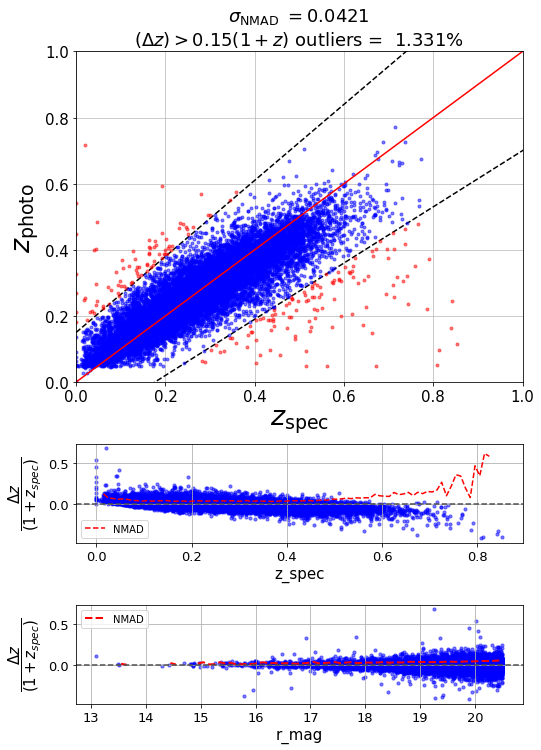

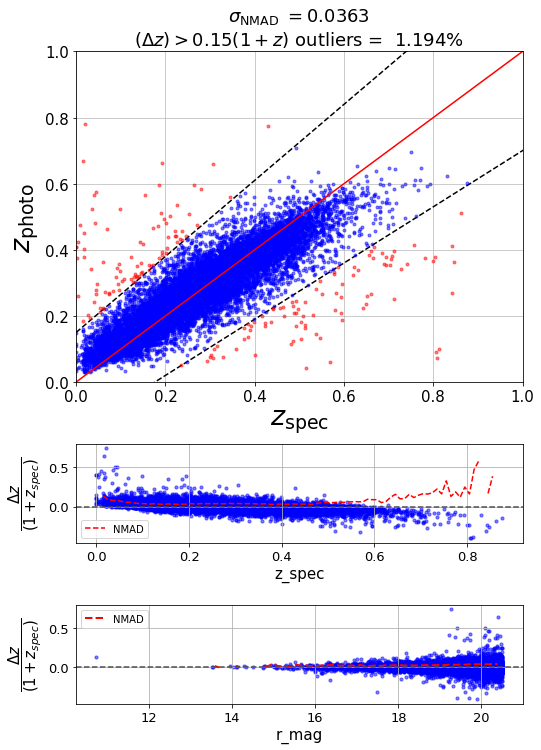

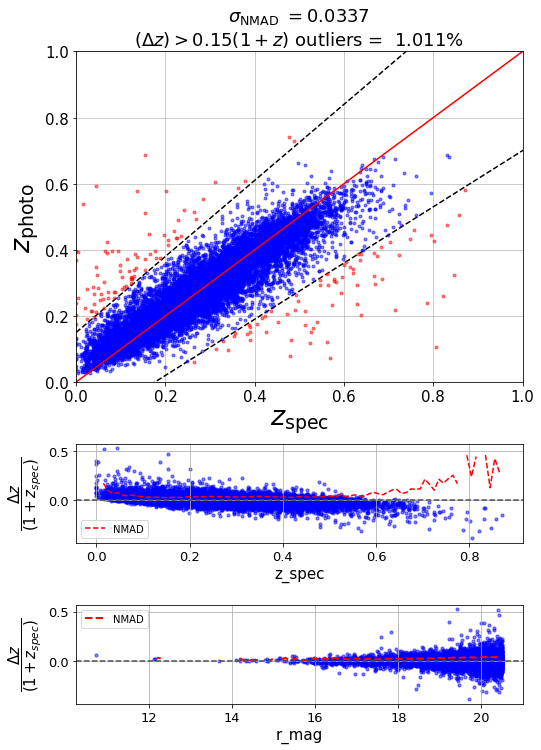

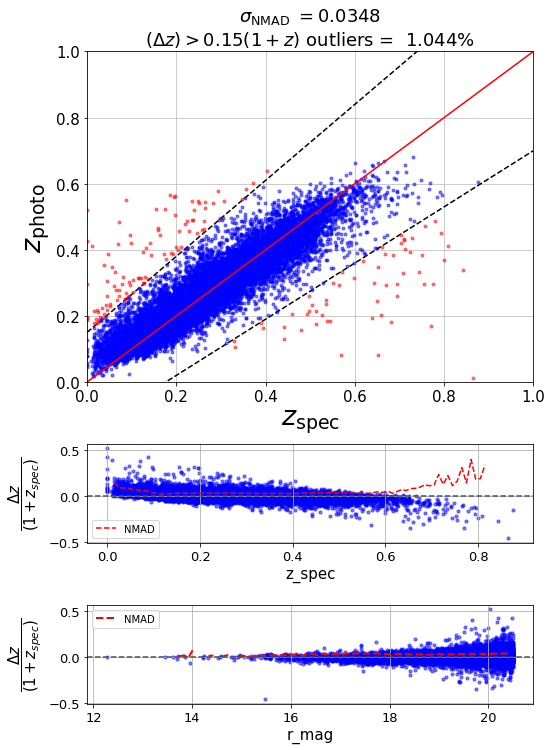

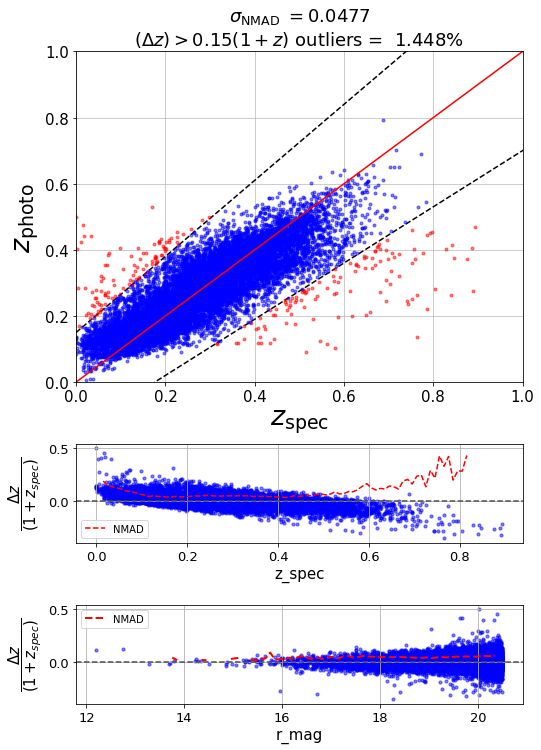

In [766]:
#trends with grid_size 
res6,zp6,zs6 = gpr(data,z,10,0.8,0.2)
res7,zp7,zs7 = gpr(data,z,20,0.8,0.2)
res8,zp8,zs8 = gpr(data,z,30,0.8,0.2)
res9,zp9,zs9 = gpr(data,z,40,0.8,0.2)
res10,zp10,zs10 = gpr(data,z,50,0.8,0.2)

In [813]:
import matplotlib as mpl
mpl.rcParams['text.usetex'] = False
mpl.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}']

/Users/yashakaushal/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Support for setting the 'text.latex.preamble' or 'pgf.preamble' rcParam to a list of strings is deprecated since 3.3 and will be removed two minor releases later; set it to a single string instead.
  This is separate from the ipykernel package so we can avoid doing imports until


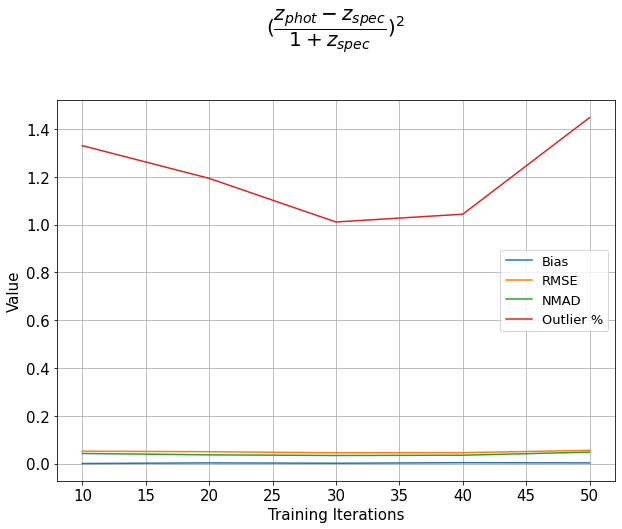

In [814]:
plt.figure(figsize=(10, 7))
f = 15
train_itr = [10,20,30,40,50]
# bias = [res1[1],res2[1],res3[1],res4[1],res5[1]]
# rmse = [res1[0],res2[0],res3[0],res4[0],res5[0]]
# nmad = [res1[6],res2[6],res3[6],res4[6],res5[6]]
# outl = [res1[7],res2[7],res3[7],res4[7],res5[7]]
# plt.plot(train_itr,bias,label='Bias')
# plt.plot(train_itr,rmse,label='RMSE')
# plt.plot(train_itr,nmad,label='NMAD')
plt.title('$(\dfrac{z_{phot} - z_{spec}}{1+z_{spec}})^{2}$ \n \n',fontsize=20)
plt.xlabel('Training Iterations',fontsize=f)
plt.ylabel('Value',fontsize=f)
plt.xticks(fontsize=f)
plt.yticks(fontsize=f)
# plt.plot(train_itr,outl,label='Outlier')
# plt.legend(loc='best',fontsize=15)
# plt.grid()

bias1 = [res6[1],res7[1],res8[1],res9[1],res10[1]]
rmse1 = [res6[0],res7[0],res8[0],res9[0],res10[0]]
nmad1 = [res6[6],res7[6],res8[6],res9[6],res10[6]]
outl1 = [res6[7],res7[7],res8[7],res9[7],res10[7]]
plt.plot(train_itr,bias1,label='Bias')
plt.plot(train_itr,rmse1,label='RMSE')
plt.plot(train_itr,nmad1,label='NMAD')
plt.plot(train_itr,outl1,label='Outlier %')
plt.legend(loc='best',fontsize=13)
plt.grid()

# plt.savefig('gp_gr200_outlier.jpeg')

In [837]:
cat.columns

Index(['DELTACHI2', 'MORPHTYPE', 'EBV', 'SERSIC', 'SHAPE_R', 'SHAPE_E1',
       'SHAPE_E2', 'PHOTSYS', 'gmag', 'rmag', 'zmag', 'w1mag', 'w2mag',
       'gfibermag', 'rfibermag', 'zfibermag', 'gr', 'rz', 'zw1', 'w1w2', 'fgr',
       'frz'],
      dtype='object')

In [ ]:
import time

# Set into eval mode
model.eval()
likelihood.eval()

with torch.no_grad():
    start_time = time.time()
    preds = likelihood(model(test_x))
    exact_covar = preds.covariance_matrix
    exact_covar_time = time.time() - start_time
    
print(f"Time to compute exact mean + covariances: {exact_covar_time:.2f}s")

## Slow, without LOVE 

In [ ]:
# Get into evaluation (predictive posterior) mode
model.eval()
likelihood.eval()
# Test points are regularly spaced along [0,1]
# Make predictions by feeding model through likelihood
with torch.no_grad(), gpytorch.settings.fast_pred_var():
#     tensor_Z = torch.linspace(0, 1, 51)
    observed_pred = likelihood(model(test_x))

In [ ]:
# Set into eval mode
model.eval()
likelihood.eval()

with torch.no_grad():
    start_time = time.time()
    preds = likelihood(model(tensor_Z.float()))
    exact_covar = preds.covariance_matrix
    exact_covar_time = time.time() - start_time
    
print(f"Time to compute exact mean + covariances: {exact_covar_time:.2f}s")

In [ ]:
plt.hist(observed_pred.median.numpy())

In [ ]:
plot_and_stats(z_test,observed_pred.mean.numpy())

## Fast with LOVE

In [74]:
# Clear the cache from the previous computations
model.train()
likelihood.train()

# Set into eval mode
model.eval()
likelihood.eval()

with torch.no_grad(), gpytorch.settings.fast_pred_var(), gpytorch.settings.max_root_decomposition_size(100):
    start_time = time.time()
    preds = likelihood(model(test_x))
    fast_time_no_cache = time.time() - start_time

In [75]:
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    start_time = time.time()
    preds = likelihood(model(test_x))
    fast_covar = preds.covariance_matrix
    fast_time_with_cache = time.time() - start_time

## Computing posterior samples (KISS-GP only) with LOVE 

In [84]:
num_samples = 20000

# Clear the cache from the previous computations
model.train()
likelihood.train()

# Set into eval mode
model.eval()
likelihood.eval()

with torch.no_grad(), gpytorch.settings.fast_pred_var(), gpytorch.settings.max_root_decomposition_size(200):
    # NEW FLAG FOR SAMPLING
    with gpytorch.settings.fast_pred_samples():
        start_time = time.time()
        _ = model(test_x).rsample(torch.Size([num_samples]))
        fast_sample_time_no_cache = time.time() - start_time
    
# Repeat the timing now that the cache is computed
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    with gpytorch.settings.fast_pred_samples():
        start_time = time.time()
        love_samples = model(test_x).rsample(torch.Size([num_samples]))
        fast_sample_time_cache = time.time() - start_time
    
print('Time to compute LOVE samples (no cache) {:.2f}s'.format(fast_sample_time_no_cache))
print('Time to compute LOVE samples (cache) {:.2f}s'.format(fast_sample_time_cache))

Time to compute LOVE samples (no cache) 19.40s
Time to compute LOVE samples (cache) 7.12s


In [ ]:
with torch.no_grad():
    start_time = time.time()
    posterior = model(test_x)
    mean, covar = posterior.mean, posterior.covariance_matrix

exact_empirical_covar = ((exact_samples - mean).t() @ (exact_samples - mean)) / num_samples
love_empirical_covar = ((love_samples - mean).t() @ (love_samples - mean)) / num_samples

exact_empirical_error = ((exact_empirical_covar - covar).abs()).mean()
love_empirical_error = ((love_empirical_covar - covar).abs()).mean()

print(f"Empirical covariance MAE (Exact samples): {exact_empirical_error}")
print(f"Empirical covariance MAE (LOVE samples): {love_empirical_error}")

In [ ]:
plt.hist((love_samples).flatten())

In [60]:
c = Table.read('bgscatalog.fits')
c.remove_column('COEFF')
c = c.to_pandas()

In [128]:
batch_size = 128
model = model_nn(train.shape[1], 5, batch_normalization=True, dropout=0, l2=10**-5, neurons_decay=0, starting_power=1)

In [838]:
cat.columns

Index(['DELTACHI2', 'MORPHTYPE', 'EBV', 'SERSIC', 'SHAPE_R', 'SHAPE_E1',
       'SHAPE_E2', 'PHOTSYS', 'gmag', 'rmag', 'zmag', 'w1mag', 'w2mag',
       'gfibermag', 'rfibermag', 'zfibermag', 'gr', 'rz', 'zw1', 'w1w2', 'fgr',
       'frz'],
      dtype='object')